In [1]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

from datetime import date
import hisepy
import numpy as np
import os
import pandas as pd
import re
import scanpy as sc

## Helper functions

In [2]:
def cache_uuid_path(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    if not os.path.isdir(cache_path):
        hise_res = hisepy.reader.cache_files([uuid])
    filename = os.listdir(cache_path)[0]
    cache_file = '{p}/{f}'.format(p = cache_path, f = filename)
    return cache_file

In [3]:
def read_csv_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_csv(cache_file)
    return res

In [4]:
def read_parquet_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = pd.read_parquet(cache_file)
    return res

In [5]:
def read_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file)
    return res

In [6]:
def backed_adata_uuid(uuid):
    cache_file = cache_uuid_path(uuid)
    res = sc.read_h5ad(cache_file, backed = 'r')
    return res

In [7]:
def rm_cache_uuid(uuid):
    cache_path = '/home/jupyter/cache/{u}'.format(u = uuid)
    rm_call = 'rm -r {d}'.format(d = cache_path)
    os.system(rm_call)

In [8]:
def format_cell_type(cell_type):
    cell_type = re.sub('\\+', 'pos', cell_type)
    cell_type = re.sub('-', 'neg', cell_type)
    cell_type = re.sub(' ', '_', cell_type)
    return cell_type

In [9]:
def filename_cell_type(filename):
    cell_type = re.sub('.+L3_','',filename)
    cell_type = re.sub('_2024.+','',cell_type)
    cell_type = re.sub('_', ' ', cell_type)
    cell_type = re.sub('pos','+', cell_type)
    cell_type = re.sub('neg','-', cell_type)
    return cell_type

In [10]:
def add_labels(adata, labels):
    obs = adata.obs
    obs = obs.reset_index(drop = True)
    obs = obs.merge(labels, on = 'barcodes', how = 'left')
    obs = obs.set_index('barcodes', drop = False)
    adata.obs = obs
    return adata

In [11]:
def element_id(n = 3):
    import periodictable
    from random import randrange
    rand_el = []
    for i in range(n):
        el = randrange(0,118)
        rand_el.append(periodictable.elements[el].name)
    rand_str = '-'.join(rand_el)
    return rand_str

## Markers for dotplots

In [12]:
broad_markers = [
    'CD3D', # T cells
    'CD3E', # T cells/NK
    'FCN1', # Monocytes/Myeloid
    'HBB', # Erythrocytes
    'MS4A1', # B cells
    'CD79A', # B cells
    'PPBP', # Platelets
    'IFI44L' # ISG-high
]

In [13]:
class_markers = [
    'CD4',
    'CD8A',
    'CD27',
    'GZMB',
    'GZMK',
    'IFI44L',
    'IKZF2',
    'KLRB1',
    'KLRF1',
    'SOX4',
    'TRAC',
    'TRDC',
    'TRDV1',
    'TRDV2'
]

## Read previous, non-tracked labels
We ran a preliminary analysis of our dataset that wasn't tracked for reproducibility. Here, we'll retrieve the labels for visualization and comparison to check for consistency.

In [14]:
original_uuid = '3868592c-0087-4ed8-98b2-4bf1b8676111'
original_df = read_parquet_uuid(original_uuid)
original_df = original_df[['barcodes', 'AIFI_L1', 'AIFI_L2', 'AIFI_L3']]
original_df = original_df.rename({'AIFI_L1': 'original_L1', 'AIFI_L2': 'original_L2', 'AIFI_L3': 'original_L3'}, axis = 1)

In [15]:
original_df.head()

,barcodes,original_L1,original_L2,original_L3
0,05ea9806794211eb93b836d1cb6129eb,DC,cDC1,cDC1
1,e225c914794011eb9282e2ceeb91ba52,DC,cDC1,cDC1
2,b1379eae795411eb958b0245821e6993,DC,cDC1,cDC1
3,b13d3a8a795411eb958b0245821e6993,DC,cDC1,cDC1
4,b1430d16795411eb958b0245821e6993,DC,cDC1,cDC1


## Read cell type hierarchy

In [16]:
hierarchy_uuid = '1a44252c-8cab-4c8f-92c9-d8f3af633790'
hierarchy_df = read_csv_uuid(hierarchy_uuid)

## Identify files for use in HISE

In [17]:
search_id = 'magnesium-potassium-zinc'

Retrieve files stored in our HISE project store

In [18]:
ps_df = hisepy.list_files_in_project_store('cohorts')
ps_df = ps_df[['id', 'name']]

Filter for files from the previous notebook using our search_id

In [19]:
search_df = ps_df[ps_df['name'].str.contains(search_id)]
search_df = search_df.sort_values('name')
search_df['AIFI_L3'] = [filename_cell_type(f) for f in search_df['name']]

In [20]:
search_df['AIFI_L3'].tolist()

['CD4 MAIT',
 'CD8 MAIT',
 'DN T cell',
 'GZMB+ Vd2 gdT',
 'GZMK+ Vd2 gdT',
 'GZMK+ memory CD4 Treg',
 'ISG+ MAIT',
 'KLRB1+ memory CD4 Treg',
 'KLRB1+ memory CD8 Treg',
 'KLRF1- effector Vd1 gdT',
 'KLRF1+ effector Vd1 gdT',
 'Memory CD4 Treg',
 'Memory CD8 Treg',
 'Naive CD4 Treg',
 'Naive Vd1 gdT',
 'Proliferating T cell',
 'SOX4+ Vd1 gdT',
 'other t reasons']

# MAIT

## Review CD4 MAIT

In [21]:
cell_type = 'CD4 MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [22]:
type_uuid

'9ef379f3-3103-4b8f-abb7-2dcba393dfca'

In [23]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 9ef379f3-3103-4b8f-abb7-2dcba393dfca
Files have been successfully downloaded!


### Clustering

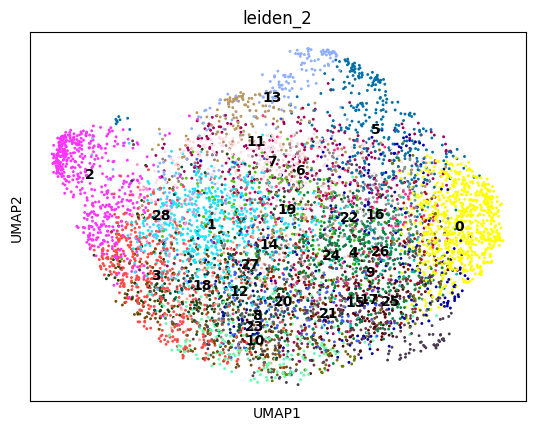

In [24]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

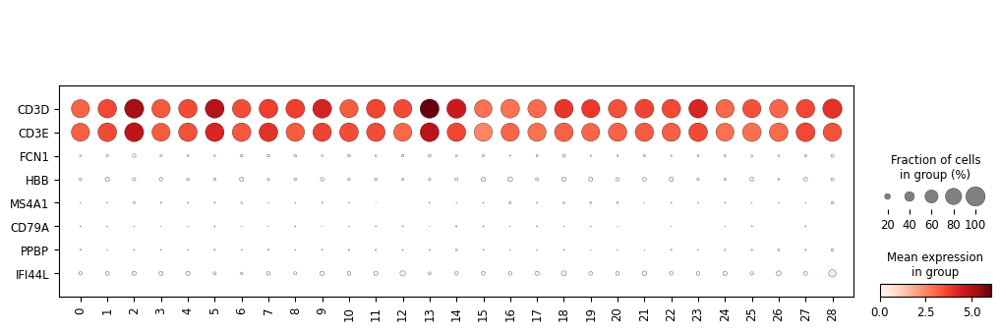

In [25]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

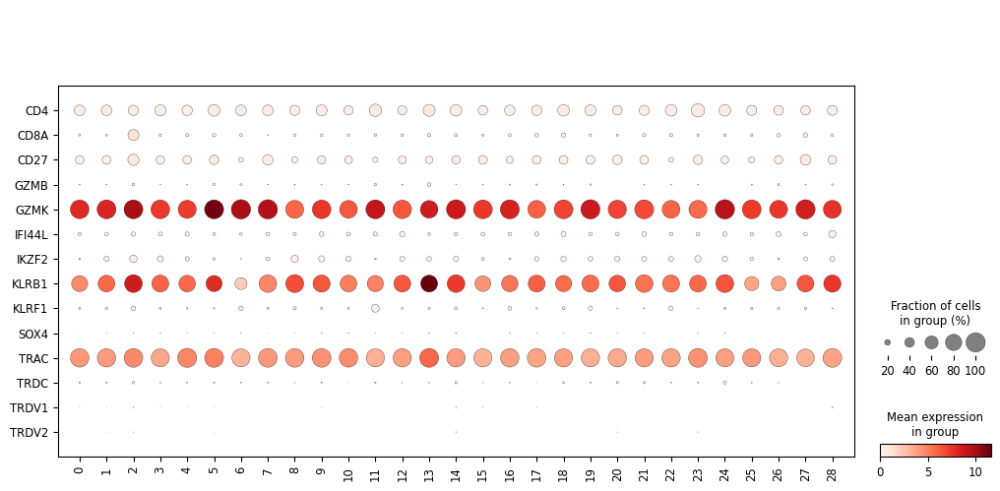

In [26]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [27]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     777
1     561
2     511
3     471
4     389
5     325
6     313
7     287
8     247
9     235
10    234
11    220
12    201
13    197
14    190
15    183
16    181
17    180
18    174
19    152
20    152
21    151
22    140
23    119
24    100
25     93
26     83
27     80
28     58
Name: count, dtype: int64

### Comparison to original labels

In [28]:
adata = add_labels(adata, original_df)

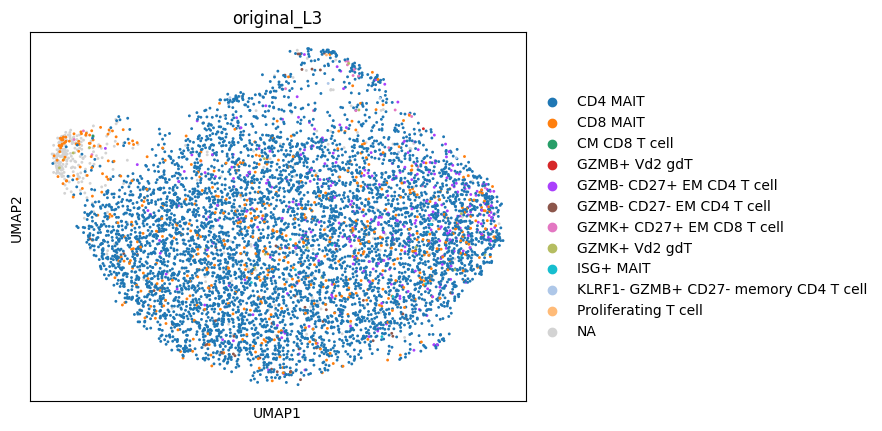

In [29]:
sc.pl.umap(adata, color = 'original_L3')

In [30]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD4 MAIT                                5676
CD8 MAIT                                 520
NaN                                      377
GZMB- CD27+ EM CD4 T cell                320
GZMB- CD27- EM CD4 T cell                 52
GZMK+ CD27+ EM CD8 T cell                 20
GZMK+ Vd2 gdT                             17
ISG+ MAIT                                 12
KLRF1- GZMB+ CD27- memory CD4 T cell       7
CM CD8 T cell                              1
GZMB+ Vd2 gdT                              1
Proliferating T cell                       1
Name: count, dtype: int64

In [31]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD4 MAIT                                0.810394
CD8 MAIT                                0.074243
NaN                                     0.053826
GZMB- CD27+ EM CD4 T cell               0.045688
GZMB- CD27- EM CD4 T cell               0.007424
GZMK+ CD27+ EM CD8 T cell               0.002856
GZMK+ Vd2 gdT                           0.002427
ISG+ MAIT                               0.001713
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000999
CM CD8 T cell                           0.000143
GZMB+ Vd2 gdT                           0.000143
Proliferating T cell                    0.000143
Name: count, dtype: float64

## Review CD8 MAIT

In [32]:
cell_type = 'CD8 MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [33]:
type_uuid

'68e15fef-1d73-4a21-b76a-4568559b573d'

In [34]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 68e15fef-1d73-4a21-b76a-4568559b573d
Files have been successfully downloaded!


### Clustering

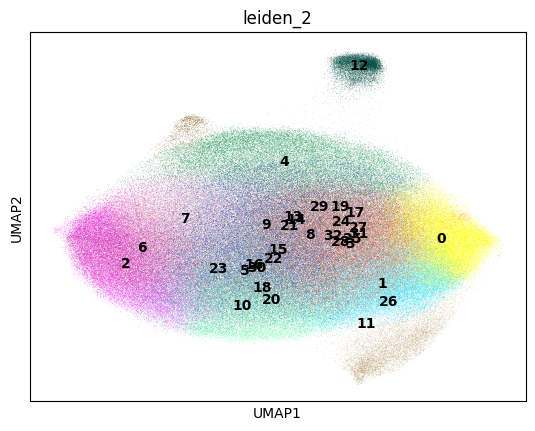

In [35]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

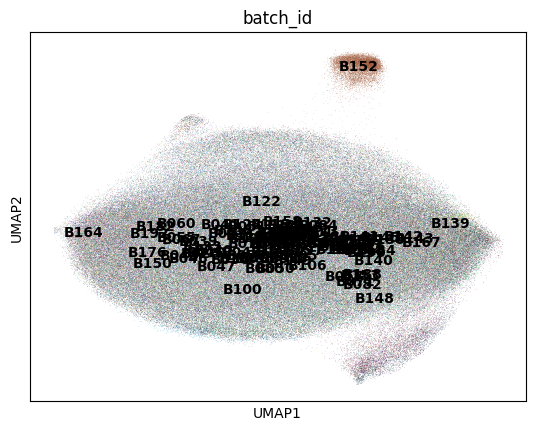

In [36]:
sc.pl.umap(adata, color = 'batch_id', legend_loc = 'on data')

### Marker expression

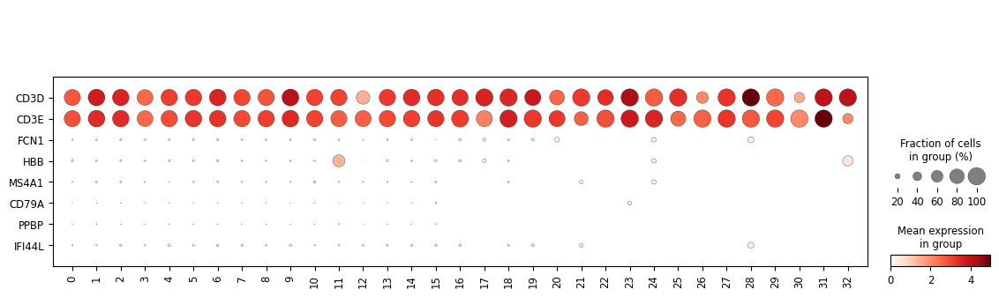

In [37]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

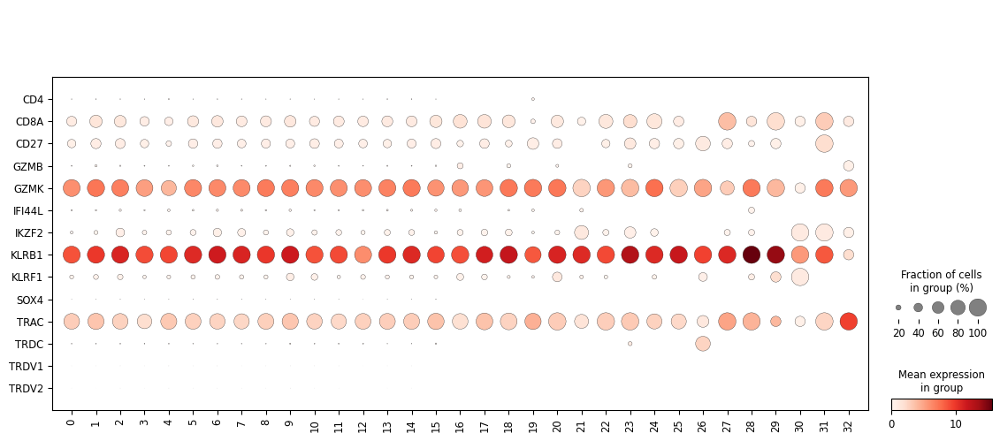

In [38]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [39]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     33546
1     31764
2     29730
3     29148
4     28100
5     27662
6     27139
7     25435
8     25180
9     24135
10    23057
11    13985
12    10849
13     8609
14     7719
15      117
16       37
17       22
18       21
19       12
20       11
21        8
22        8
23        7
24        6
25        6
26        5
27        4
28        4
29        2
30        2
31        2
32        2
Name: count, dtype: int64

### Comparison to original labels

In [40]:
adata = add_labels(adata, original_df)

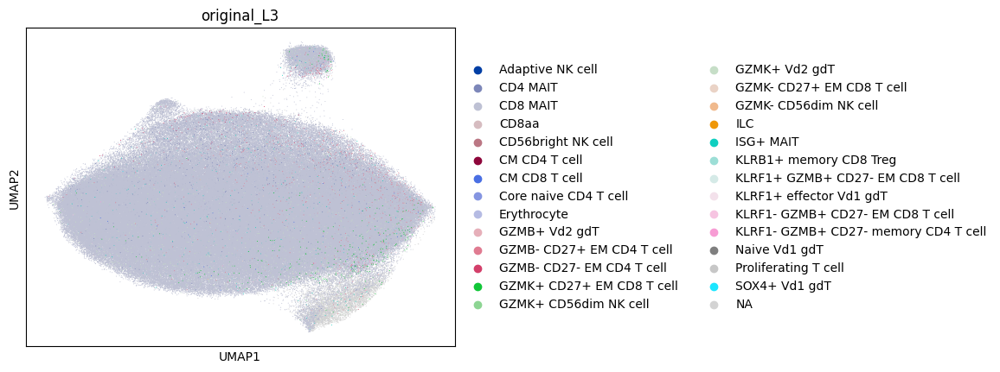

In [41]:
sc.pl.umap(adata, color = 'original_L3', size = 2)

In [42]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
CD8 MAIT                                323504
NaN                                      16113
CD4 MAIT                                  2093
GZMK+ Vd2 gdT                             1722
GZMB- CD27+ EM CD4 T cell                 1101
ISG+ MAIT                                  882
GZMK+ CD27+ EM CD8 T cell                  541
GZMB- CD27- EM CD4 T cell                  118
CM CD8 T cell                               71
KLRF1- GZMB+ CD27- memory CD4 T cell        48
GZMK- CD27+ EM CD8 T cell                   41
GZMK+ CD56dim NK cell                       19
GZMB+ Vd2 gdT                               18
KLRF1- GZMB+ CD27- EM CD8 T cell            18
Erythrocyte                                  8
Proliferating T cell                         7
CD8aa                                        5
CM CD4 T cell                                5
KLRF1+ GZMB+ CD27- EM CD8 T cell             4
Naive Vd1 gdT                                3
GZMK- CD56dim NK cell                        3
S

In [43]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
CD8 MAIT                                0.934081
NaN                                     0.046524
CD4 MAIT                                0.006043
GZMK+ Vd2 gdT                           0.004972
GZMB- CD27+ EM CD4 T cell               0.003179
ISG+ MAIT                               0.002547
GZMK+ CD27+ EM CD8 T cell               0.001562
GZMB- CD27- EM CD4 T cell               0.000341
CM CD8 T cell                           0.000205
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000139
GZMK- CD27+ EM CD8 T cell               0.000118
GZMK+ CD56dim NK cell                   0.000055
GZMB+ Vd2 gdT                           0.000052
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000052
Erythrocyte                             0.000023
Proliferating T cell                    0.000020
CD8aa                                   0.000014
CM CD4 T cell                           0.000014
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000012
Naive Vd1 gdT                           0.000009
GZMK- CD

## Review ISG+ MAIT

In [44]:
cell_type = 'ISG+ MAIT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [45]:
type_uuid

'c7771269-0a24-4bcb-a88b-cea706339422'

In [46]:
adata = read_adata_uuid(type_uuid)

downloading fileID: c7771269-0a24-4bcb-a88b-cea706339422
Files have been successfully downloaded!


### Clustering

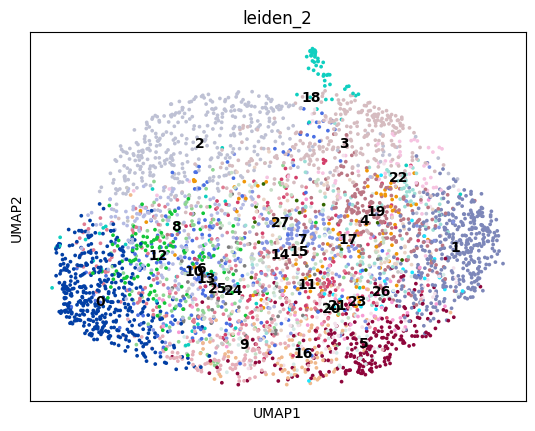

In [47]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

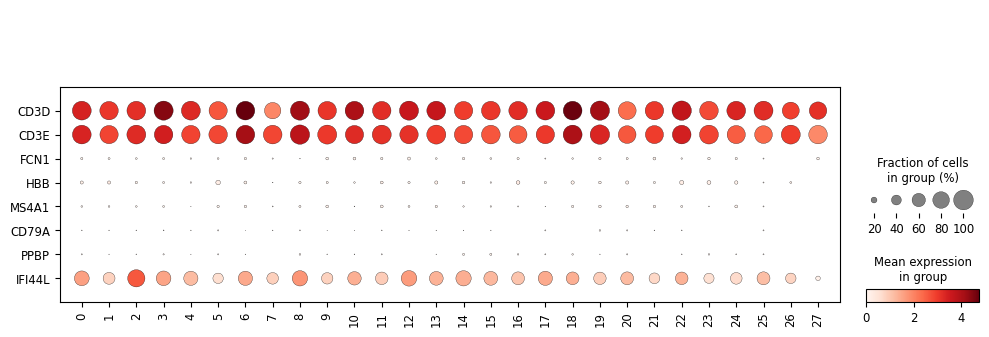

In [48]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

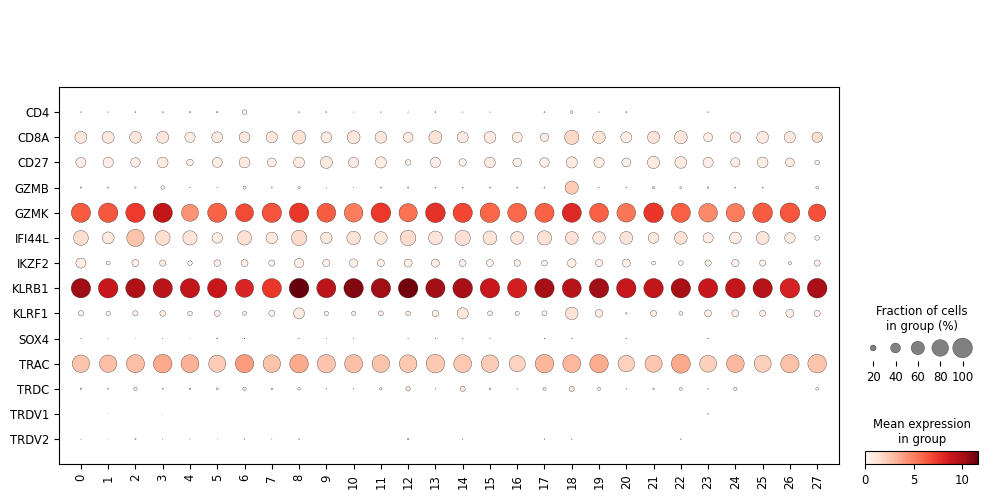

In [49]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Cluster counts

In [50]:
adata.obs['leiden_2'].value_counts()

leiden_2
0     430
1     411
2     374
3     299
4     257
5     251
6     202
7     161
8     158
9     152
10    144
11    132
12    109
13    101
14     99
15     97
16     93
17     92
18     87
19     86
20     79
21     78
22     63
23     60
24     52
25     47
26     23
27     14
Name: count, dtype: int64

### Comparison to original labels

In [51]:
adata = add_labels(adata, original_df)

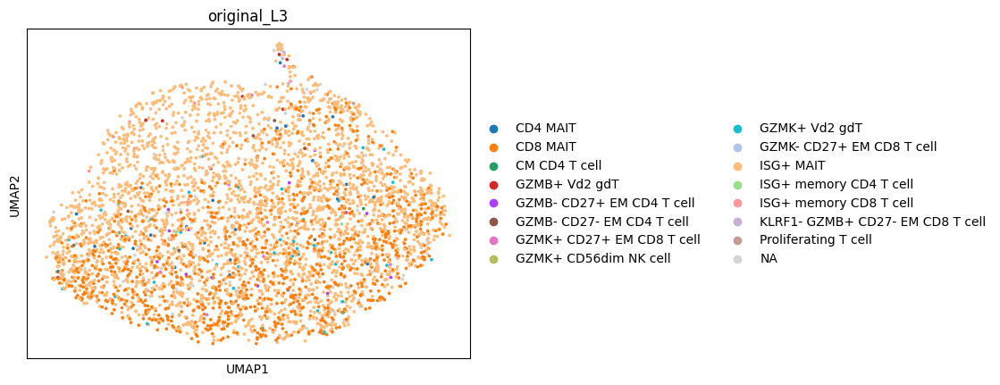

In [52]:
sc.pl.umap(adata, color = 'original_L3')

In [53]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
ISG+ MAIT                           2854
CD8 MAIT                            1032
NaN                                  121
GZMK+ Vd2 gdT                         44
CD4 MAIT                              27
GZMB- CD27+ EM CD4 T cell             16
GZMK+ CD27+ EM CD8 T cell             12
ISG+ memory CD8 T cell                12
GZMB+ Vd2 gdT                         11
GZMB- CD27- EM CD4 T cell              7
KLRF1- GZMB+ CD27- EM CD8 T cell       5
GZMK+ CD56dim NK cell                  3
GZMK- CD27+ EM CD8 T cell              3
ISG+ memory CD4 T cell                 2
CM CD4 T cell                          1
Proliferating T cell                   1
Name: count, dtype: int64

In [54]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
ISG+ MAIT                           0.687545
CD8 MAIT                            0.248615
NaN                                 0.029150
GZMK+ Vd2 gdT                       0.010600
CD4 MAIT                            0.006504
GZMB- CD27+ EM CD4 T cell           0.003854
GZMK+ CD27+ EM CD8 T cell           0.002891
ISG+ memory CD8 T cell              0.002891
GZMB+ Vd2 gdT                       0.002650
GZMB- CD27- EM CD4 T cell           0.001686
KLRF1- GZMB+ CD27- EM CD8 T cell    0.001205
GZMK+ CD56dim NK cell               0.000723
GZMK- CD27+ EM CD8 T cell           0.000723
ISG+ memory CD4 T cell              0.000482
CM CD4 T cell                       0.000241
Proliferating T cell                0.000241
Name: count, dtype: float64

## Review DN T cell

In [55]:
cell_type = 'DN T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [56]:
type_uuid

'7e67a4a5-f7c4-4682-bab2-2c84ce21862d'

In [57]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 7e67a4a5-f7c4-4682-bab2-2c84ce21862d
Files have been successfully downloaded!


### Clustering

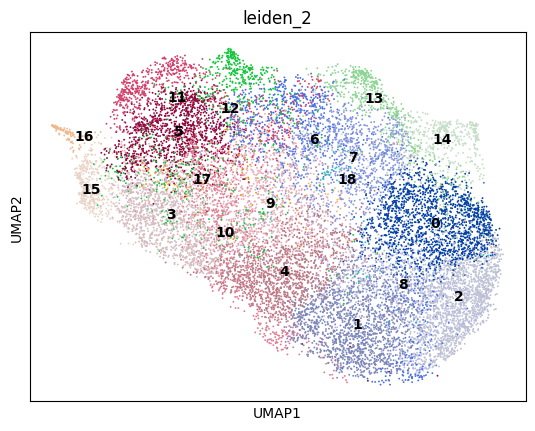

In [58]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

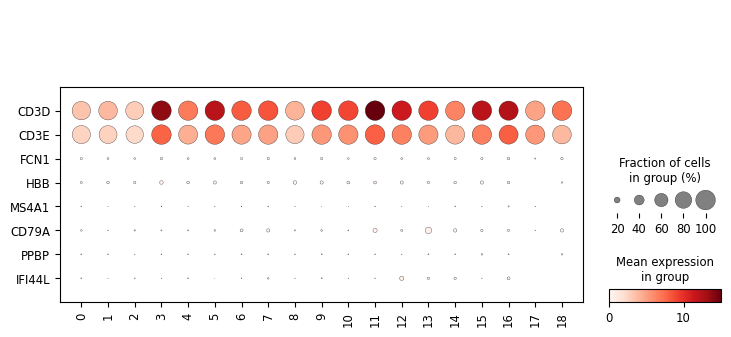

In [59]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

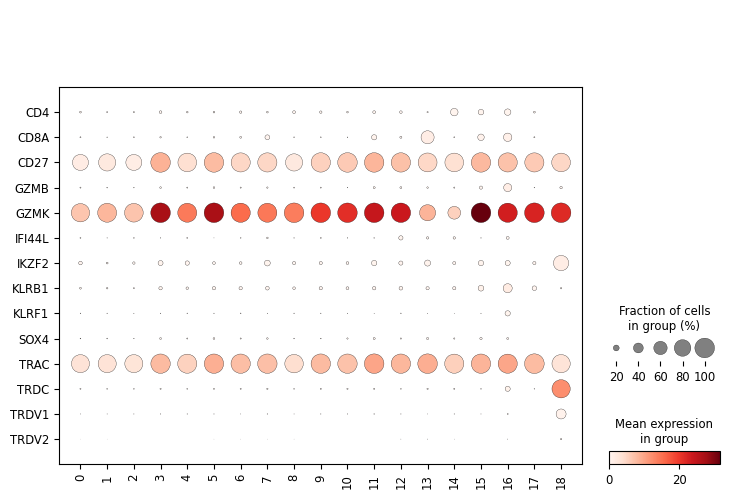

In [60]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [61]:
adata = add_labels(adata, original_df)

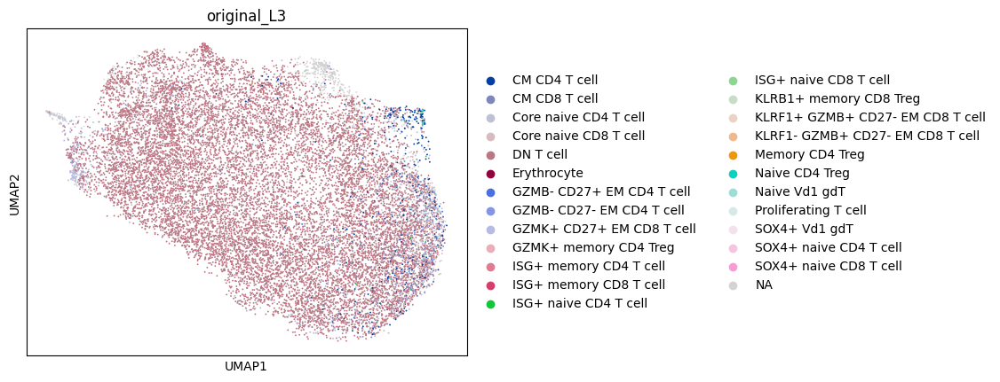

In [62]:
sc.pl.umap(adata, color = 'original_L3')

In [63]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
DN T cell                           14251
NaN                                   600
GZMK+ CD27+ EM CD8 T cell             433
CM CD4 T cell                         363
Core naive CD4 T cell                 356
CM CD8 T cell                         340
Core naive CD8 T cell                 203
Proliferating T cell                   75
Naive CD4 Treg                         24
GZMK+ memory CD4 Treg                  20
GZMB- CD27+ EM CD4 T cell              15
ISG+ memory CD8 T cell                 14
Naive Vd1 gdT                          14
SOX4+ naive CD4 T cell                  9
SOX4+ Vd1 gdT                           7
ISG+ naive CD4 T cell                   7
Memory CD4 Treg                         3
KLRF1+ GZMB+ CD27- EM CD8 T cell        3
Erythrocyte                             3
ISG+ memory CD4 T cell                  3
GZMB- CD27- EM CD4 T cell               3
KLRF1- GZMB+ CD27- EM CD8 T cell        1
ISG+ naive CD8 T cell                   1
SOX4+ naive CD8 T cell

In [64]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
DN T cell                           0.850806
NaN                                 0.035821
GZMK+ CD27+ EM CD8 T cell           0.025851
CM CD4 T cell                       0.021672
Core naive CD4 T cell               0.021254
CM CD8 T cell                       0.020299
Core naive CD8 T cell               0.012119
Proliferating T cell                0.004478
Naive CD4 Treg                      0.001433
GZMK+ memory CD4 Treg               0.001194
GZMB- CD27+ EM CD4 T cell           0.000896
ISG+ memory CD8 T cell              0.000836
Naive Vd1 gdT                       0.000836
SOX4+ naive CD4 T cell              0.000537
SOX4+ Vd1 gdT                       0.000418
ISG+ naive CD4 T cell               0.000418
Memory CD4 Treg                     0.000179
KLRF1+ GZMB+ CD27- EM CD8 T cell    0.000179
Erythrocyte                         0.000179
ISG+ memory CD4 T cell              0.000179
GZMB- CD27- EM CD4 T cell           0.000179
KLRF1- GZMB+ CD27- EM CD8 T cell    0.00006

# Treg

## Review GZMK+ memory CD4 Treg

In [65]:
cell_type = 'GZMK+ memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [66]:
type_uuid

'73c68087-b328-4c22-8306-abc1e4540c5e'

In [67]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 73c68087-b328-4c22-8306-abc1e4540c5e
Files have been successfully downloaded!


### Clustering

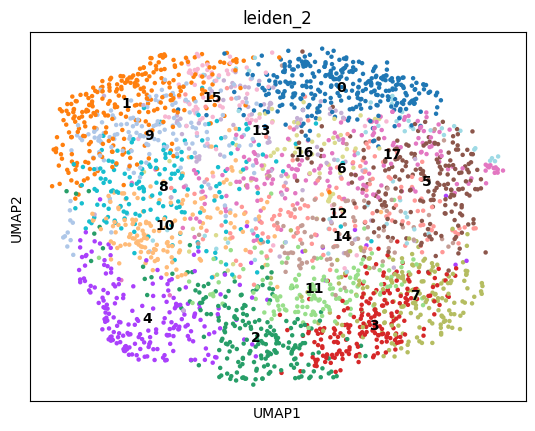

In [68]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

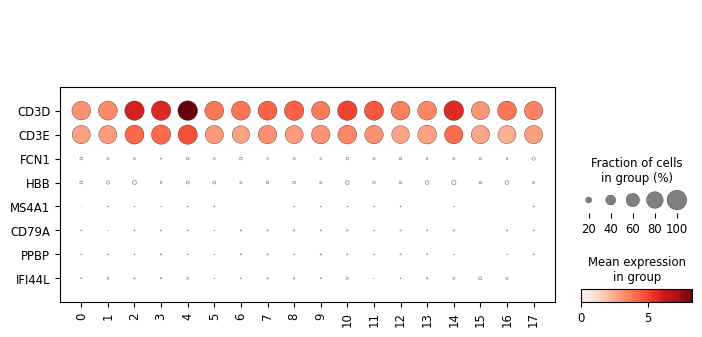

In [69]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

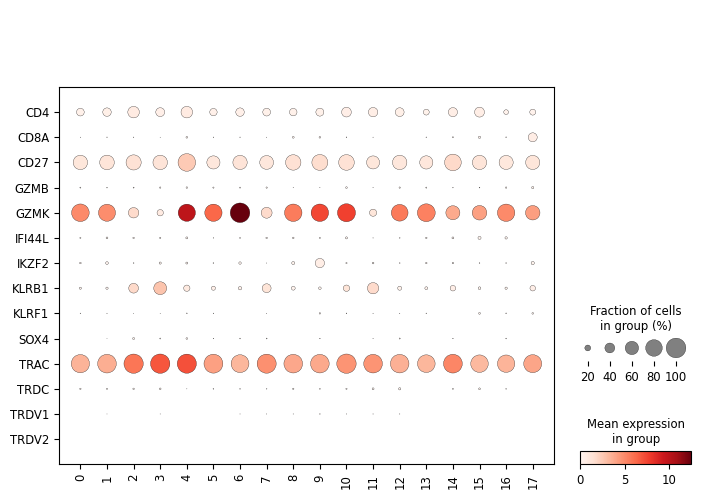

In [70]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [71]:
adata = add_labels(adata, original_df)

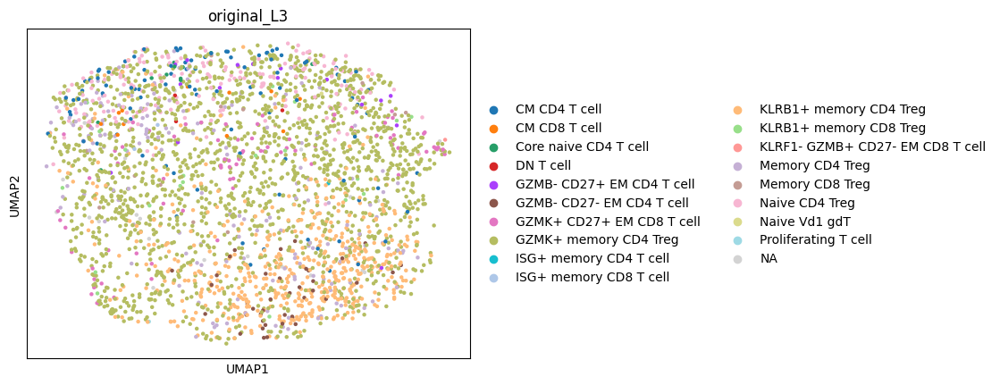

In [72]:
sc.pl.umap(adata, color = 'original_L3')

In [73]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK+ memory CD4 Treg               1687
KLRB1+ memory CD4 Treg               530
Naive CD4 Treg                       184
Memory CD4 Treg                      177
CM CD4 T cell                         97
GZMK+ CD27+ EM CD8 T cell             86
GZMB- CD27- EM CD4 T cell             40
NaN                                   24
KLRB1+ memory CD8 Treg                21
GZMB- CD27+ EM CD4 T cell             17
Memory CD8 Treg                       13
CM CD8 T cell                         11
Core naive CD4 T cell                 11
DN T cell                              3
ISG+ memory CD8 T cell                 3
ISG+ memory CD4 T cell                 1
KLRF1- GZMB+ CD27- EM CD8 T cell       1
Naive Vd1 gdT                          1
Proliferating T cell                   1
Name: count, dtype: int64

In [74]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK+ memory CD4 Treg               0.580124
KLRB1+ memory CD4 Treg              0.182256
Naive CD4 Treg                      0.063274
Memory CD4 Treg                     0.060867
CM CD4 T cell                       0.033356
GZMK+ CD27+ EM CD8 T cell           0.029574
GZMB- CD27- EM CD4 T cell           0.013755
NaN                                 0.008253
KLRB1+ memory CD8 Treg              0.007221
GZMB- CD27+ EM CD4 T cell           0.005846
Memory CD8 Treg                     0.004470
CM CD8 T cell                       0.003783
Core naive CD4 T cell               0.003783
DN T cell                           0.001032
ISG+ memory CD8 T cell              0.001032
ISG+ memory CD4 T cell              0.000344
KLRF1- GZMB+ CD27- EM CD8 T cell    0.000344
Naive Vd1 gdT                       0.000344
Proliferating T cell                0.000344
Name: count, dtype: float64

## Review KLRB1+ memory CD4 Treg

In [75]:
cell_type = 'KLRB1+ memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [76]:
type_uuid

'e2246ee2-56f8-4b61-b506-47710c8ea252'

In [77]:
adata = read_adata_uuid(type_uuid)

downloading fileID: e2246ee2-56f8-4b61-b506-47710c8ea252
Files have been successfully downloaded!


### Clustering

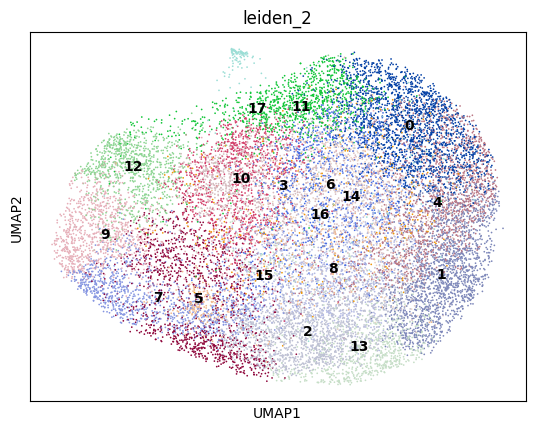

In [78]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

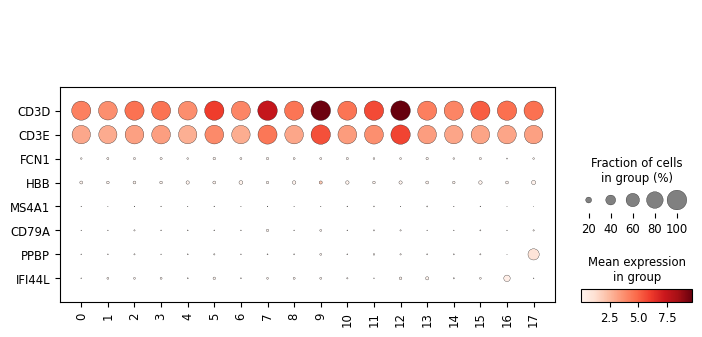

In [79]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

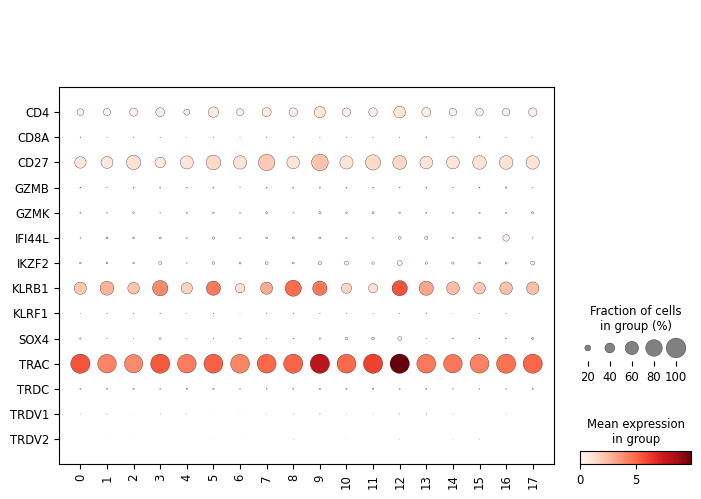

In [80]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [81]:
adata = add_labels(adata, original_df)

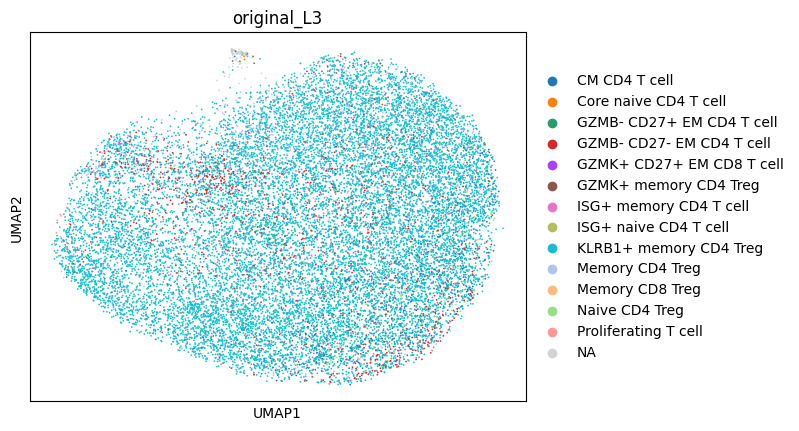

In [82]:
sc.pl.umap(adata, color = 'original_L3')

In [83]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
KLRB1+ memory CD4 Treg       16187
Memory CD4 Treg               1152
GZMB- CD27- EM CD4 T cell      956
CM CD4 T cell                  654
GZMK+ memory CD4 Treg          244
Naive CD4 Treg                 193
NaN                            146
Proliferating T cell            16
Core naive CD4 T cell           14
ISG+ memory CD4 T cell          14
Memory CD8 Treg                 12
GZMB- CD27+ EM CD4 T cell        5
GZMK+ CD27+ EM CD8 T cell        1
ISG+ naive CD4 T cell            1
Name: count, dtype: int64

In [84]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
KLRB1+ memory CD4 Treg       0.826078
Memory CD4 Treg              0.058791
GZMB- CD27- EM CD4 T cell    0.048788
CM CD4 T cell                0.033376
GZMK+ memory CD4 Treg        0.012452
Naive CD4 Treg               0.009849
NaN                          0.007451
Proliferating T cell         0.000817
Core naive CD4 T cell        0.000714
ISG+ memory CD4 T cell       0.000714
Memory CD8 Treg              0.000612
GZMB- CD27+ EM CD4 T cell    0.000255
GZMK+ CD27+ EM CD8 T cell    0.000051
ISG+ naive CD4 T cell        0.000051
Name: count, dtype: float64

## Review KLRB1+ memory CD8 Treg

In [85]:
cell_type = 'KLRB1+ memory CD8 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [86]:
type_uuid

'29b0e1d7-3d52-45cf-91df-1f5a1eeca5e3'

In [87]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 29b0e1d7-3d52-45cf-91df-1f5a1eeca5e3
Files have been successfully downloaded!


### Clustering

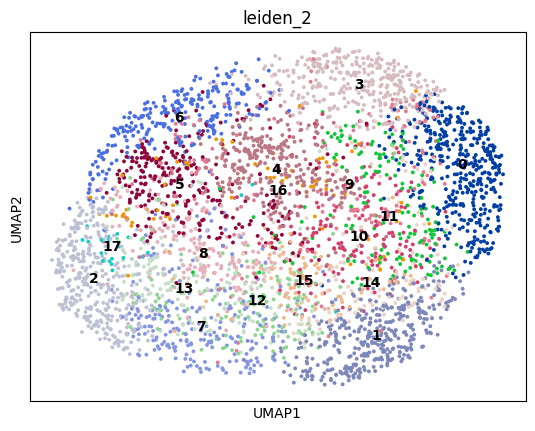

In [88]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

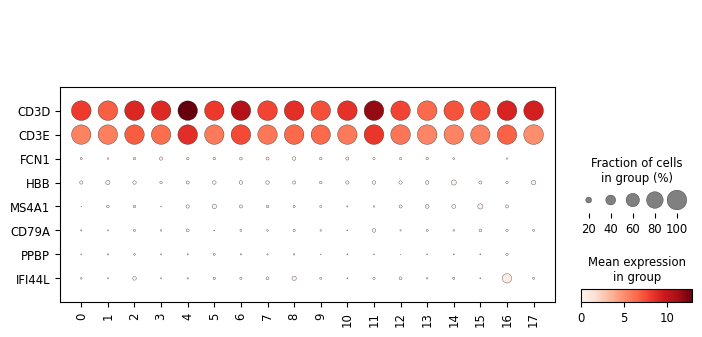

In [89]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

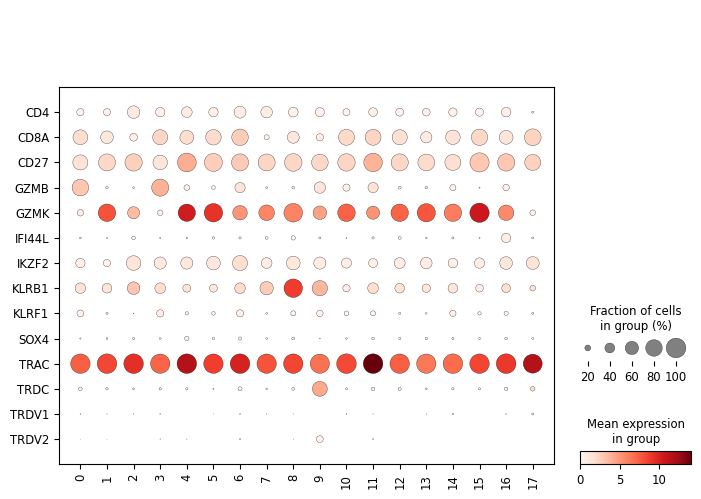

In [90]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [91]:
adata = add_labels(adata, original_df)

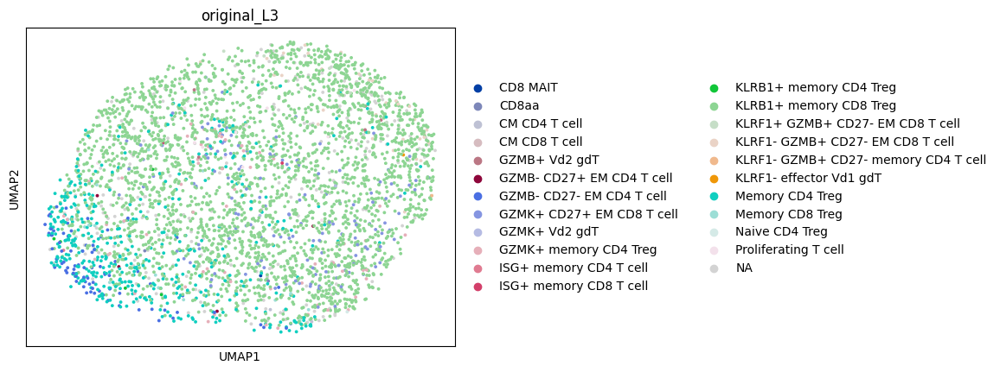

In [92]:
sc.pl.umap(adata, color = 'original_L3')

In [93]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
KLRB1+ memory CD8 Treg                  2806
Memory CD4 Treg                          433
NaN                                      254
GZMK+ CD27+ EM CD8 T cell                151
GZMB- CD27- EM CD4 T cell                 81
GZMK+ memory CD4 Treg                     64
KLRF1- GZMB+ CD27- EM CD8 T cell          31
Memory CD8 Treg                           18
Proliferating T cell                      15
CM CD8 T cell                              5
GZMB+ Vd2 gdT                              5
KLRB1+ memory CD4 Treg                     5
KLRF1+ GZMB+ CD27- EM CD8 T cell           5
GZMB- CD27+ EM CD4 T cell                  4
Naive CD4 Treg                             2
ISG+ memory CD8 T cell                     2
CD8aa                                      2
GZMK+ Vd2 gdT                              2
CM CD4 T cell                              2
KLRF1- GZMB+ CD27- memory CD4 T cell       1
KLRF1- effector Vd1 gdT                    1
ISG+ memory CD4 T cell                     

In [94]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
KLRB1+ memory CD8 Treg                  0.721151
Memory CD4 Treg                         0.111282
NaN                                     0.065279
GZMK+ CD27+ EM CD8 T cell               0.038808
GZMB- CD27- EM CD4 T cell               0.020817
GZMK+ memory CD4 Treg                   0.016448
KLRF1- GZMB+ CD27- EM CD8 T cell        0.007967
Memory CD8 Treg                         0.004626
Proliferating T cell                    0.003855
CM CD8 T cell                           0.001285
GZMB+ Vd2 gdT                           0.001285
KLRB1+ memory CD4 Treg                  0.001285
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.001285
GZMB- CD27+ EM CD4 T cell               0.001028
Naive CD4 Treg                          0.000514
ISG+ memory CD8 T cell                  0.000514
CD8aa                                   0.000514
GZMK+ Vd2 gdT                           0.000514
CM CD4 T cell                           0.000514
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000257
KLRF1- e

## Review Memory CD4 Treg

In [95]:
cell_type = 'Memory CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [96]:
type_uuid

'fa147a9b-7fc6-4908-8cb6-0ae3727a2b95'

In [97]:
adata = read_adata_uuid(type_uuid)

downloading fileID: fa147a9b-7fc6-4908-8cb6-0ae3727a2b95
Files have been successfully downloaded!


### Clustering

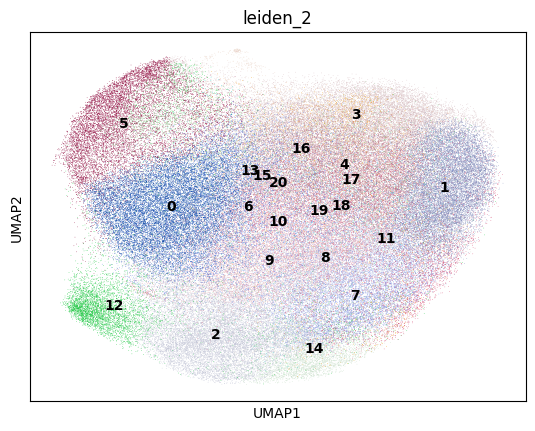

In [98]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

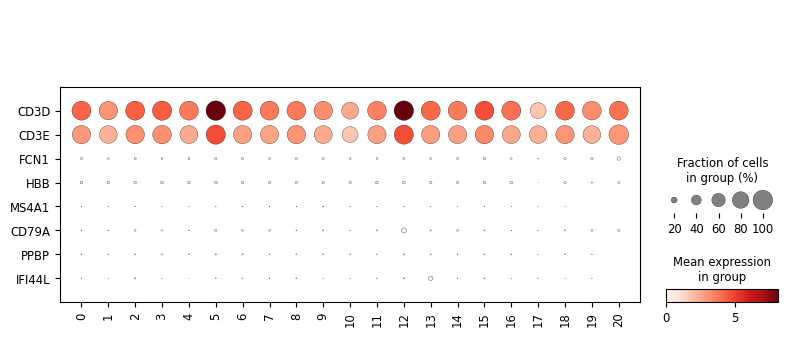

In [99]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

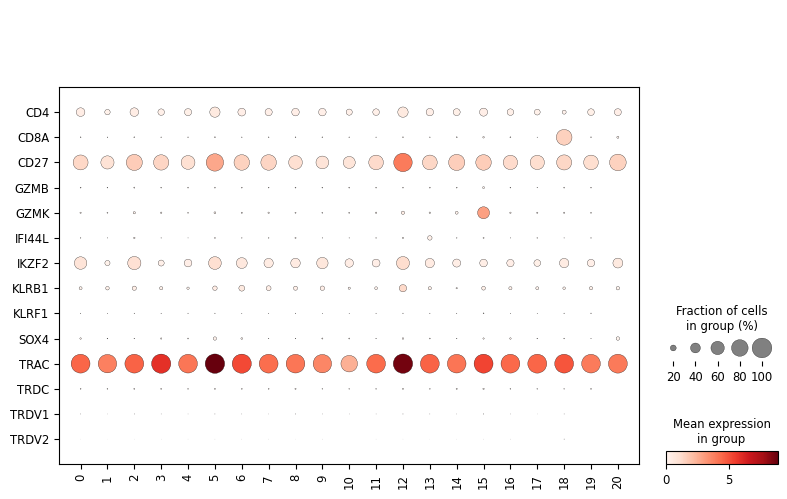

In [100]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [101]:
adata = add_labels(adata, original_df)

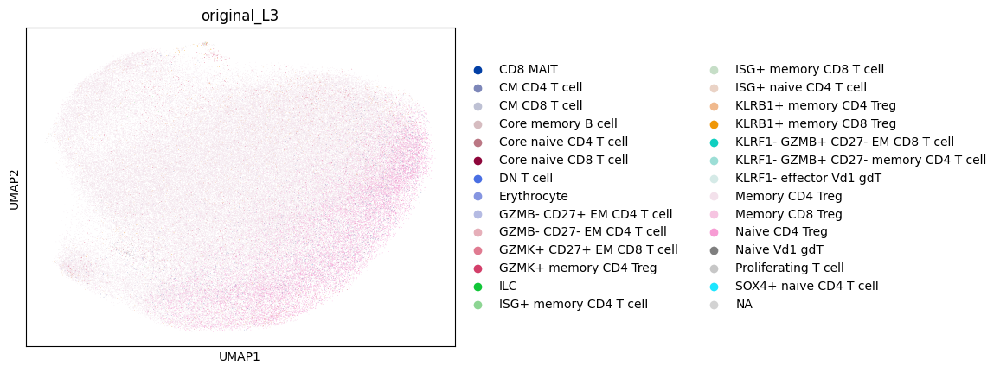

In [102]:
sc.pl.umap(adata, color = 'original_L3')

In [103]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Memory CD4 Treg                         117790
Naive CD4 Treg                           17956
CM CD4 T cell                             2082
KLRB1+ memory CD4 Treg                    1682
GZMK+ memory CD4 Treg                      923
GZMB- CD27- EM CD4 T cell                  801
NaN                                        740
Memory CD8 Treg                            299
Core naive CD4 T cell                      103
KLRB1+ memory CD8 Treg                      74
ISG+ memory CD4 T cell                      49
GZMK+ CD27+ EM CD8 T cell                   44
Proliferating T cell                        33
GZMB- CD27+ EM CD4 T cell                   17
Erythrocyte                                  8
CM CD8 T cell                                8
SOX4+ naive CD4 T cell                       3
ISG+ naive CD4 T cell                        3
CD8 MAIT                                     2
KLRF1- GZMB+ CD27- memory CD4 T cell         1
KLRF1- effector Vd1 gdT                      1
K

In [104]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Memory CD4 Treg                         0.825866
Naive CD4 Treg                          0.125896
CM CD4 T cell                           0.014598
KLRB1+ memory CD4 Treg                  0.011793
GZMK+ memory CD4 Treg                   0.006471
GZMB- CD27- EM CD4 T cell               0.005616
NaN                                     0.005188
Memory CD8 Treg                         0.002096
Core naive CD4 T cell                   0.000722
KLRB1+ memory CD8 Treg                  0.000519
ISG+ memory CD4 T cell                  0.000344
GZMK+ CD27+ EM CD8 T cell               0.000308
Proliferating T cell                    0.000231
GZMB- CD27+ EM CD4 T cell               0.000119
Erythrocyte                             0.000056
CM CD8 T cell                           0.000056
SOX4+ naive CD4 T cell                  0.000021
ISG+ naive CD4 T cell                   0.000021
CD8 MAIT                                0.000014
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000007
KLRF1- e

## Review Memory CD8 Treg

In [105]:
cell_type = 'Memory CD8 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [106]:
type_uuid

'5ae73117-eff3-4834-b06b-8415012c89ea'

In [107]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 5ae73117-eff3-4834-b06b-8415012c89ea
Files have been successfully downloaded!


### Clustering

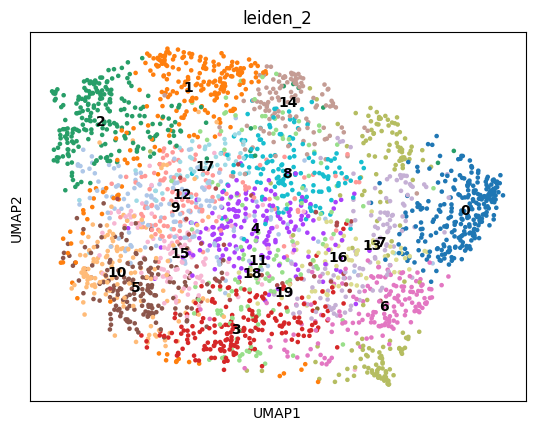

In [108]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

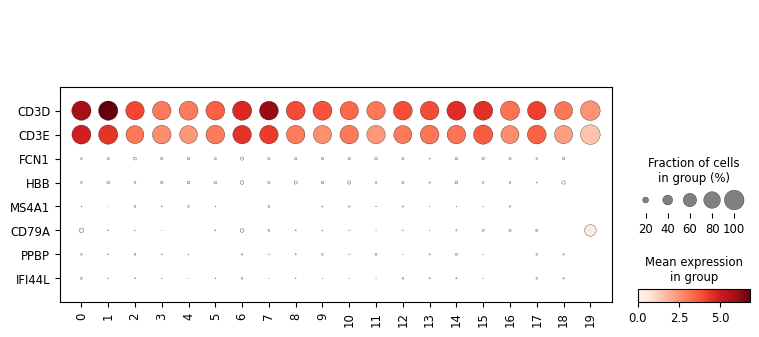

In [109]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

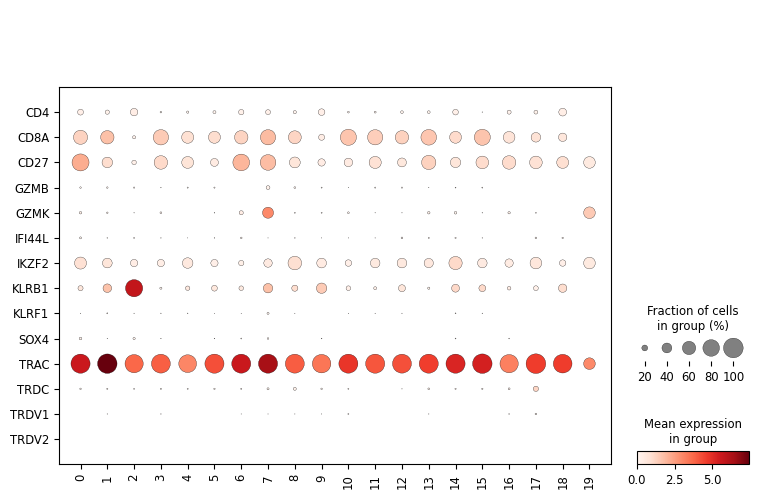

In [110]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [111]:
adata = add_labels(adata, original_df)

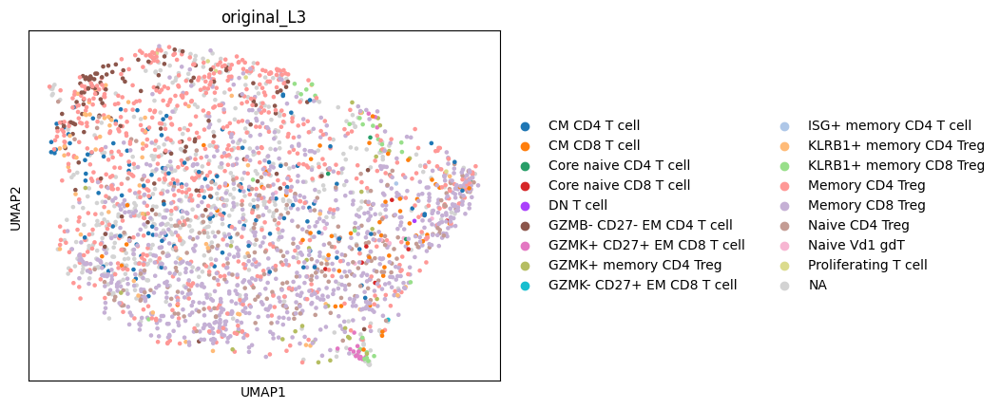

In [112]:
sc.pl.umap(adata, color = 'original_L3')

In [113]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Memory CD8 Treg              892
Memory CD4 Treg              696
NaN                          517
Naive CD4 Treg               220
CM CD4 T cell                113
GZMB- CD27- EM CD4 T cell    111
KLRB1+ memory CD4 Treg        58
CM CD8 T cell                 51
GZMK+ memory CD4 Treg         28
KLRB1+ memory CD8 Treg        27
GZMK+ CD27+ EM CD8 T cell     16
Naive Vd1 gdT                  8
Core naive CD8 T cell          7
Proliferating T cell           5
Core naive CD4 T cell          4
GZMK- CD27+ EM CD8 T cell      1
DN T cell                      1
ISG+ memory CD4 T cell         1
Name: count, dtype: int64

In [114]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Memory CD8 Treg              0.323657
Memory CD4 Treg              0.252540
NaN                          0.187591
Naive CD4 Treg               0.079826
CM CD4 T cell                0.041001
GZMB- CD27- EM CD4 T cell    0.040276
KLRB1+ memory CD4 Treg       0.021045
CM CD8 T cell                0.018505
GZMK+ memory CD4 Treg        0.010160
KLRB1+ memory CD8 Treg       0.009797
GZMK+ CD27+ EM CD8 T cell    0.005806
Naive Vd1 gdT                0.002903
Core naive CD8 T cell        0.002540
Proliferating T cell         0.001814
Core naive CD4 T cell        0.001451
GZMK- CD27+ EM CD8 T cell    0.000363
DN T cell                    0.000363
ISG+ memory CD4 T cell       0.000363
Name: count, dtype: float64

## Review Naive CD4 Treg

In [115]:
cell_type = 'Naive CD4 Treg'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [116]:
type_uuid

'81a498dd-1475-4d2b-8b0e-1e8438bef526'

In [117]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 81a498dd-1475-4d2b-8b0e-1e8438bef526
Files have been successfully downloaded!


### Clustering

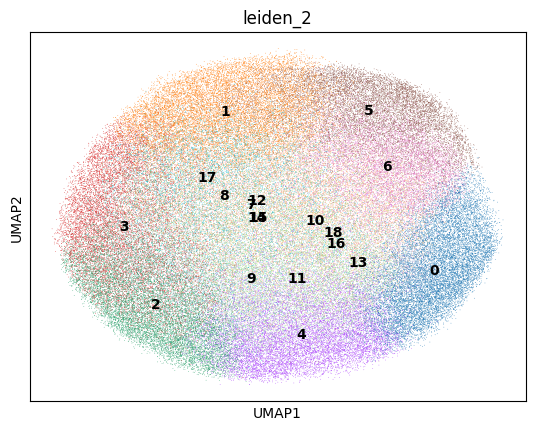

In [118]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

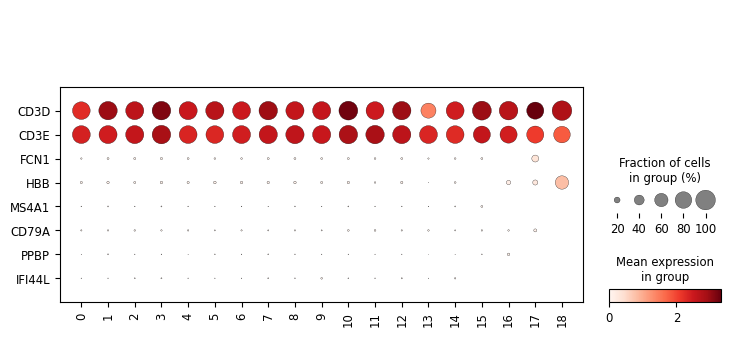

In [119]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

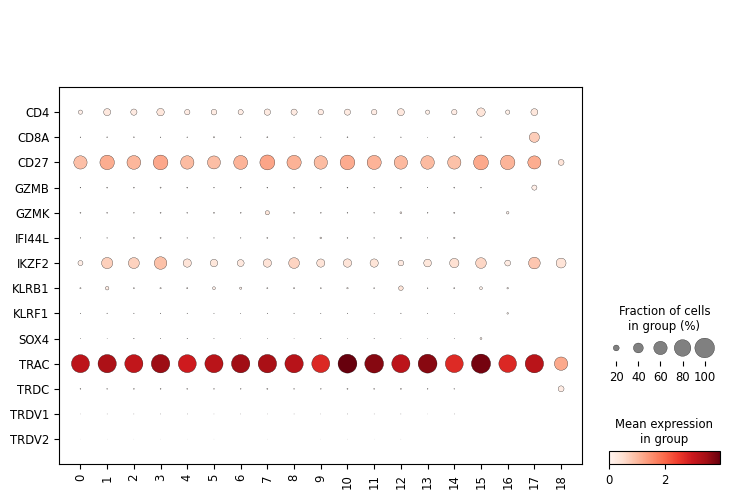

In [120]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [121]:
adata = add_labels(adata, original_df)

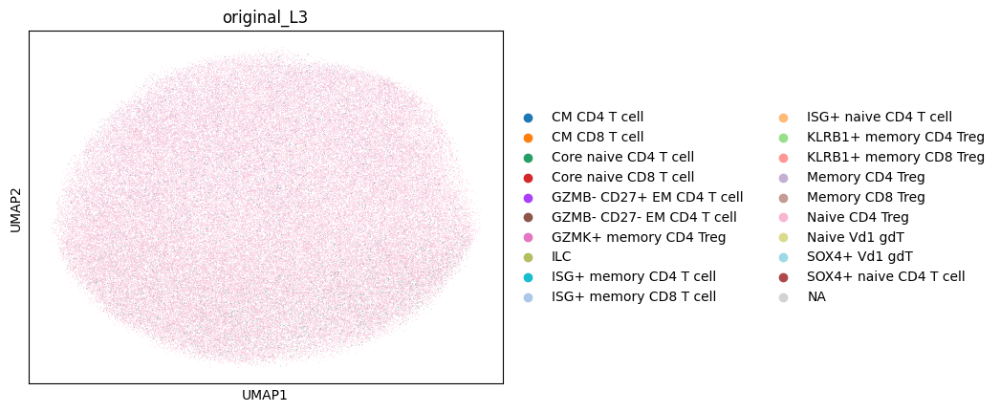

In [122]:
sc.pl.umap(adata, color = 'original_L3')

In [123]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Naive CD4 Treg               117559
Core naive CD4 T cell          3499
Memory CD4 Treg                2197
CM CD4 T cell                  1372
NaN                             479
Memory CD8 Treg                 107
KLRB1+ memory CD4 Treg           83
GZMK+ memory CD4 Treg            72
ISG+ naive CD4 T cell            41
Core naive CD8 T cell            33
Naive Vd1 gdT                    28
SOX4+ naive CD4 T cell           23
CM CD8 T cell                    21
GZMB- CD27- EM CD4 T cell        18
GZMB- CD27+ EM CD4 T cell        12
ISG+ memory CD4 T cell            8
SOX4+ Vd1 gdT                     4
KLRB1+ memory CD8 Treg            2
ILC                               1
ISG+ memory CD8 T cell            1
Name: count, dtype: int64

In [124]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Naive CD4 Treg               0.936277
Core naive CD4 T cell        0.027867
Memory CD4 Treg              0.017498
CM CD4 T cell                0.010927
NaN                          0.003815
Memory CD8 Treg              0.000852
KLRB1+ memory CD4 Treg       0.000661
GZMK+ memory CD4 Treg        0.000573
ISG+ naive CD4 T cell        0.000327
Core naive CD8 T cell        0.000263
Naive Vd1 gdT                0.000223
SOX4+ naive CD4 T cell       0.000183
CM CD8 T cell                0.000167
GZMB- CD27- EM CD4 T cell    0.000143
GZMB- CD27+ EM CD4 T cell    0.000096
ISG+ memory CD4 T cell       0.000064
SOX4+ Vd1 gdT                0.000032
KLRB1+ memory CD8 Treg       0.000016
ILC                          0.000008
ISG+ memory CD8 T cell       0.000008
Name: count, dtype: float64

# Vd1 gdT

## Review KLRF1- effector Vd1 gdT

In [125]:
cell_type = 'KLRF1- effector Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [126]:
type_uuid

'74682b95-c8d7-4b60-bc52-e6e4c741041b'

In [127]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 74682b95-c8d7-4b60-bc52-e6e4c741041b
Files have been successfully downloaded!


### Clustering

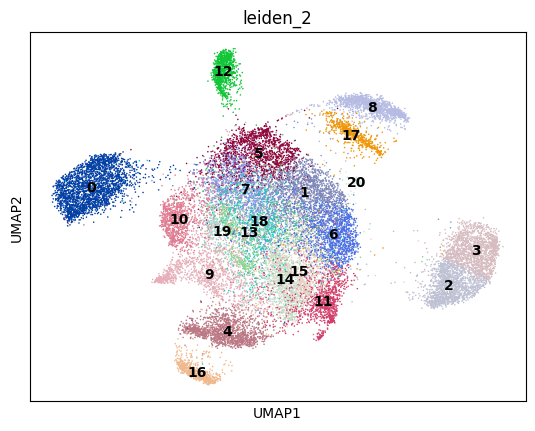

In [128]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

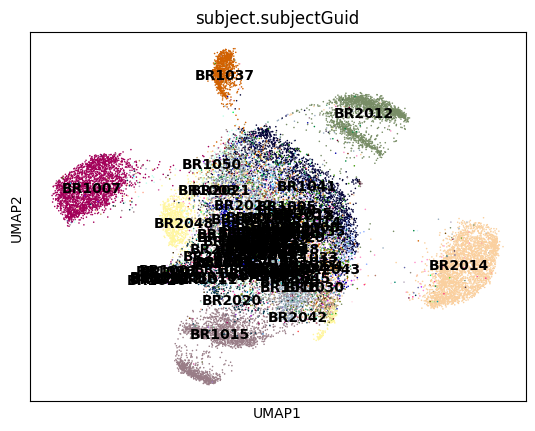

In [129]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

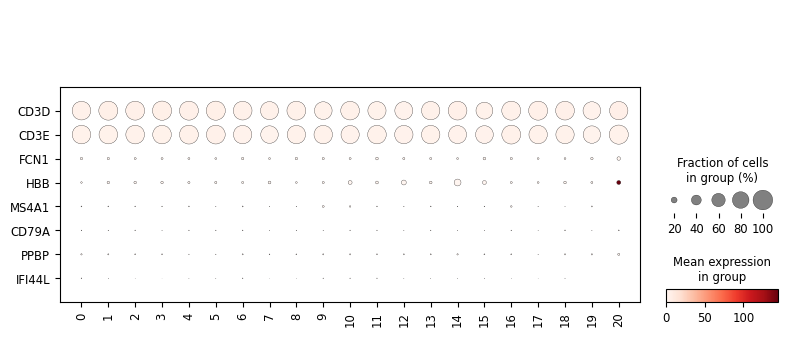

In [130]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

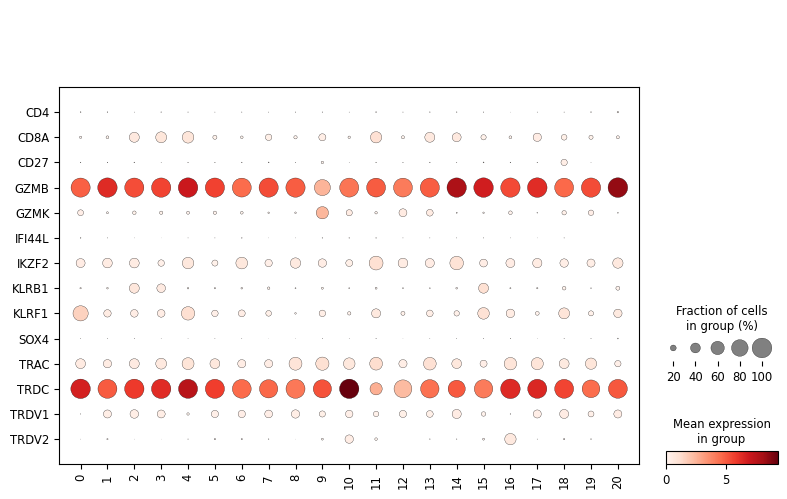

In [131]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [132]:
adata = add_labels(adata, original_df)

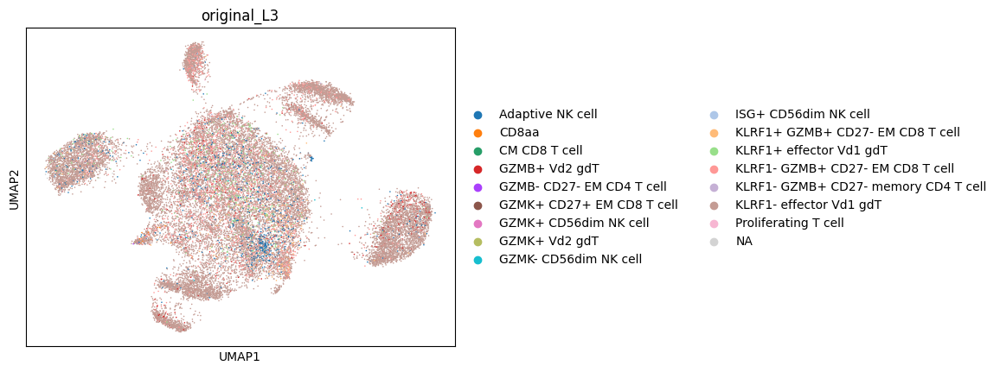

In [133]:
sc.pl.umap(adata, color = 'original_L3')

In [134]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
KLRF1- effector Vd1 gdT                 19546
KLRF1- GZMB+ CD27- EM CD8 T cell         1908
Adaptive NK cell                          881
KLRF1+ effector Vd1 gdT                   556
GZMB+ Vd2 gdT                             395
KLRF1+ GZMB+ CD27- EM CD8 T cell          242
NaN                                       132
KLRF1- GZMB+ CD27- memory CD4 T cell       44
CD8aa                                      11
GZMK- CD56dim NK cell                      10
GZMK+ Vd2 gdT                               7
GZMK+ CD27+ EM CD8 T cell                   5
GZMB- CD27- EM CD4 T cell                   4
Proliferating T cell                        2
ISG+ CD56dim NK cell                        1
GZMK+ CD56dim NK cell                       1
CM CD8 T cell                               1
Name: count, dtype: int64

In [135]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
KLRF1- effector Vd1 gdT                 0.823128
KLRF1- GZMB+ CD27- EM CD8 T cell        0.080350
Adaptive NK cell                        0.037101
KLRF1+ effector Vd1 gdT                 0.023414
GZMB+ Vd2 gdT                           0.016634
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.010191
NaN                                     0.005559
KLRF1- GZMB+ CD27- memory CD4 T cell    0.001853
CD8aa                                   0.000463
GZMK- CD56dim NK cell                   0.000421
GZMK+ Vd2 gdT                           0.000295
GZMK+ CD27+ EM CD8 T cell               0.000211
GZMB- CD27- EM CD4 T cell               0.000168
Proliferating T cell                    0.000084
ISG+ CD56dim NK cell                    0.000042
GZMK+ CD56dim NK cell                   0.000042
CM CD8 T cell                           0.000042
Name: count, dtype: float64

## Review KLRF1+ effector Vd1 gdT

In [136]:
cell_type = 'KLRF1+ effector Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [137]:
type_uuid

'45922f1b-4b1f-4c61-a647-ea8c427e95d2'

In [138]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 45922f1b-4b1f-4c61-a647-ea8c427e95d2
Files have been successfully downloaded!


### Clustering

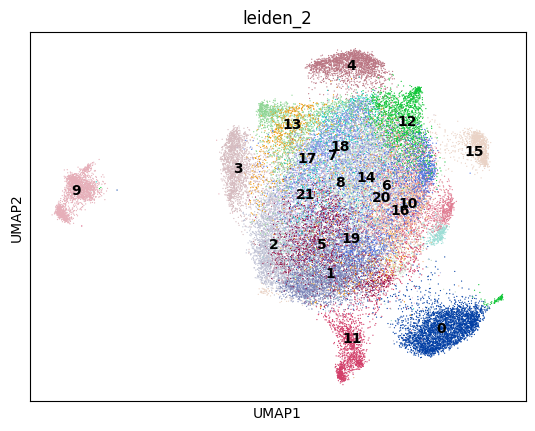

In [139]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

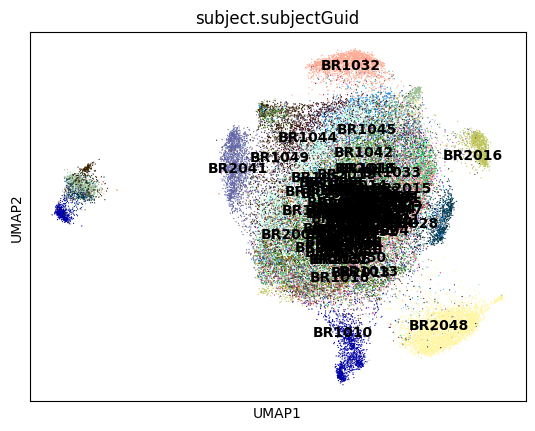

In [140]:
sc.pl.umap(adata, color = 'subject.subjectGuid', legend_loc = 'on data')

### Marker expression

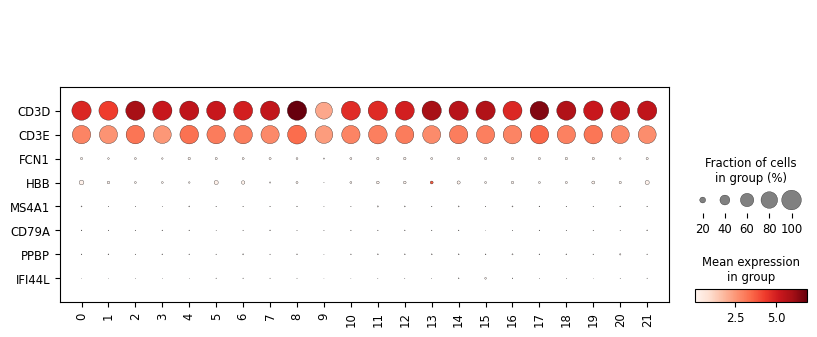

In [141]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

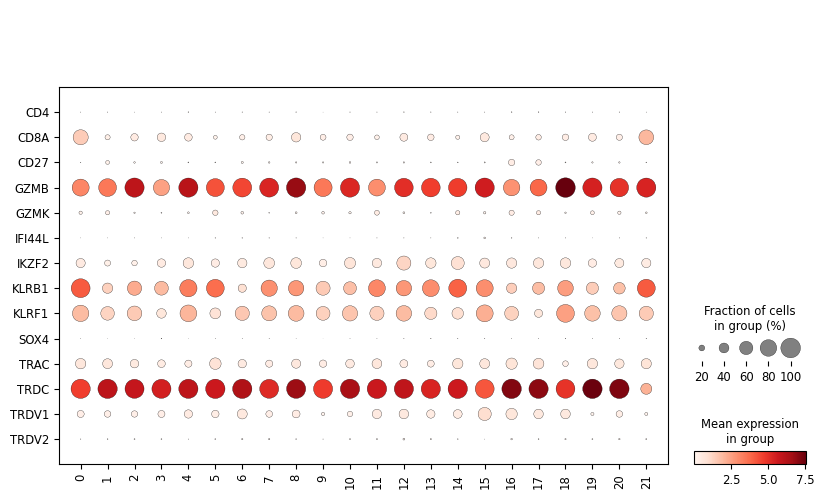

In [142]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [143]:
adata = add_labels(adata, original_df)

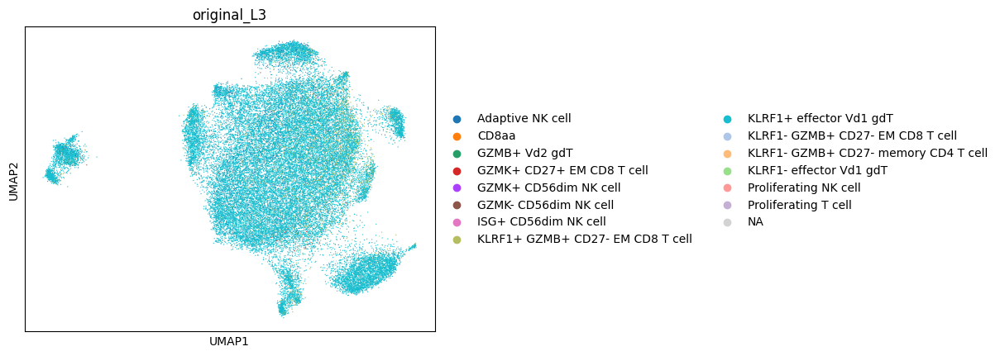

In [144]:
sc.pl.umap(adata, color = 'original_L3')

In [145]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
KLRF1+ effector Vd1 gdT                 33010
KLRF1+ GZMB+ CD27- EM CD8 T cell         1737
Adaptive NK cell                         1409
KLRF1- GZMB+ CD27- EM CD8 T cell          716
KLRF1- effector Vd1 gdT                   554
NaN                                       320
GZMB+ Vd2 gdT                             159
GZMK+ CD27+ EM CD8 T cell                  38
GZMK- CD56dim NK cell                      16
GZMK+ CD56dim NK cell                       6
Proliferating T cell                        5
KLRF1- GZMB+ CD27- memory CD4 T cell        4
CD8aa                                       1
ISG+ CD56dim NK cell                        1
Proliferating NK cell                       1
Name: count, dtype: int64

In [146]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
KLRF1+ effector Vd1 gdT                 0.869210
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.045738
Adaptive NK cell                        0.037101
KLRF1- GZMB+ CD27- EM CD8 T cell        0.018854
KLRF1- effector Vd1 gdT                 0.014588
NaN                                     0.008426
GZMB+ Vd2 gdT                           0.004187
GZMK+ CD27+ EM CD8 T cell               0.001001
GZMK- CD56dim NK cell                   0.000421
GZMK+ CD56dim NK cell                   0.000158
Proliferating T cell                    0.000132
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000105
CD8aa                                   0.000026
ISG+ CD56dim NK cell                    0.000026
Proliferating NK cell                   0.000026
Name: count, dtype: float64

## Review Naive Vd1 gdT

In [147]:
cell_type = 'Naive Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [148]:
type_uuid

'9da57cb8-99b8-4a29-8979-faf917e672e4'

In [149]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 9da57cb8-99b8-4a29-8979-faf917e672e4
Files have been successfully downloaded!


### Clustering

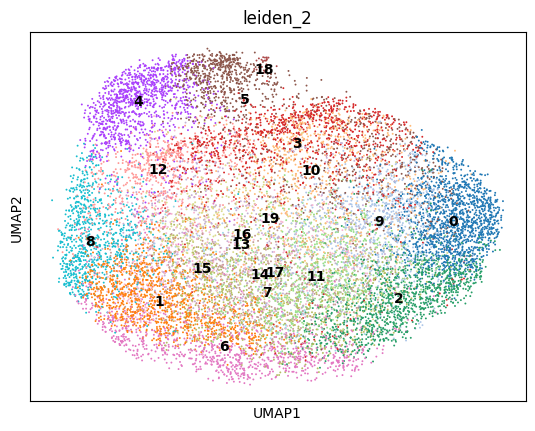

In [150]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

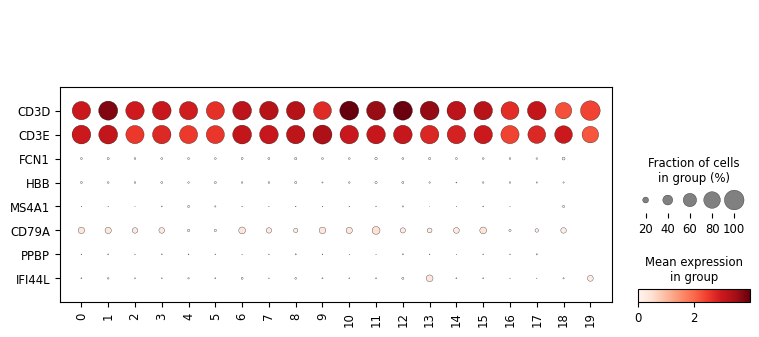

In [151]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

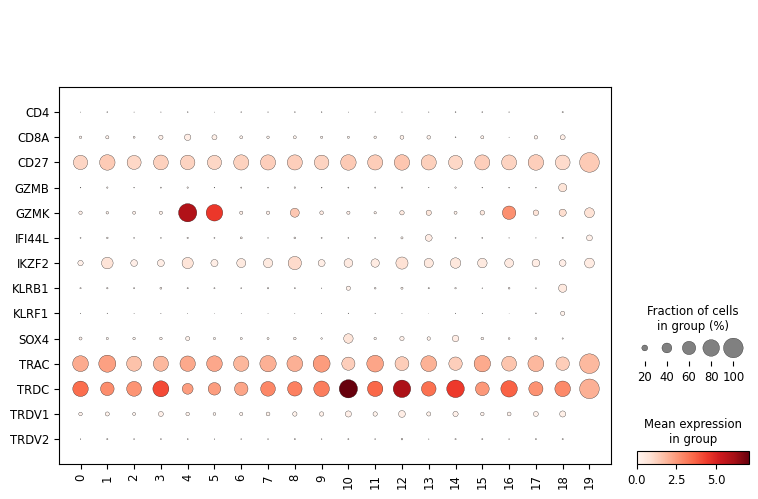

In [152]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [153]:
adata = add_labels(adata, original_df)

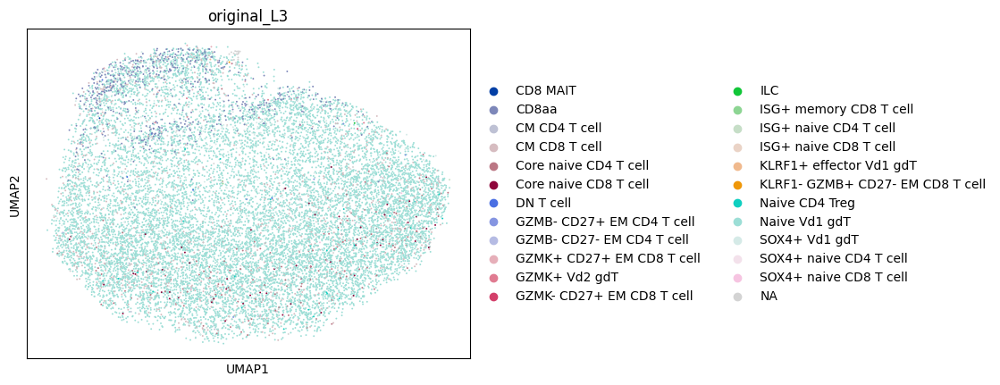

In [154]:
sc.pl.umap(adata, color = 'original_L3')

In [155]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Naive Vd1 gdT                       13206
CM CD8 T cell                         878
CD8aa                                 587
SOX4+ Vd1 gdT                         460
NaN                                   190
Core naive CD4 T cell                 181
Core naive CD8 T cell                  58
Naive CD4 Treg                         36
CM CD4 T cell                          23
GZMK+ CD27+ EM CD8 T cell              16
GZMK+ Vd2 gdT                          10
ISG+ naive CD4 T cell                   6
GZMB- CD27+ EM CD4 T cell               5
SOX4+ naive CD8 T cell                  5
DN T cell                               5
GZMB- CD27- EM CD4 T cell               3
SOX4+ naive CD4 T cell                  3
ISG+ memory CD8 T cell                  2
ISG+ naive CD8 T cell                   2
CD8 MAIT                                1
KLRF1- GZMB+ CD27- EM CD8 T cell        1
KLRF1+ effector Vd1 gdT                 1
GZMK- CD27+ EM CD8 T cell               1
ILC                   

In [156]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Naive Vd1 gdT                       0.842166
CM CD8 T cell                       0.055991
CD8aa                               0.037434
SOX4+ Vd1 gdT                       0.029335
NaN                                 0.012117
Core naive CD4 T cell               0.011543
Core naive CD8 T cell               0.003699
Naive CD4 Treg                      0.002296
CM CD4 T cell                       0.001467
GZMK+ CD27+ EM CD8 T cell           0.001020
GZMK+ Vd2 gdT                       0.000638
ISG+ naive CD4 T cell               0.000383
GZMB- CD27+ EM CD4 T cell           0.000319
SOX4+ naive CD8 T cell              0.000319
DN T cell                           0.000319
GZMB- CD27- EM CD4 T cell           0.000191
SOX4+ naive CD4 T cell              0.000191
ISG+ memory CD8 T cell              0.000128
ISG+ naive CD8 T cell               0.000128
CD8 MAIT                            0.000064
KLRF1- GZMB+ CD27- EM CD8 T cell    0.000064
KLRF1+ effector Vd1 gdT             0.00006

## Review SOX4+ Vd1 gdT

In [157]:
cell_type = 'SOX4+ Vd1 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [158]:
type_uuid

'53850428-d391-4654-a2bb-acaa36cc2e1d'

In [159]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 53850428-d391-4654-a2bb-acaa36cc2e1d
Files have been successfully downloaded!


### Clustering

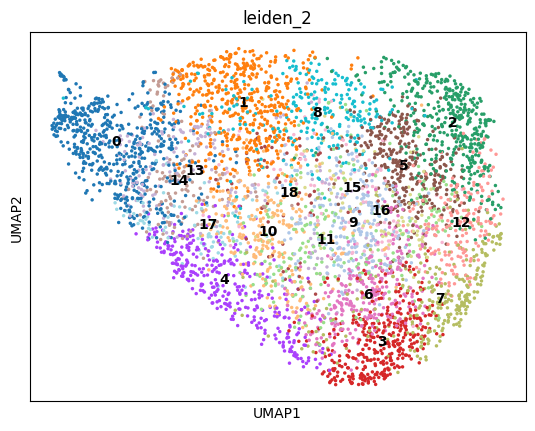

In [160]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

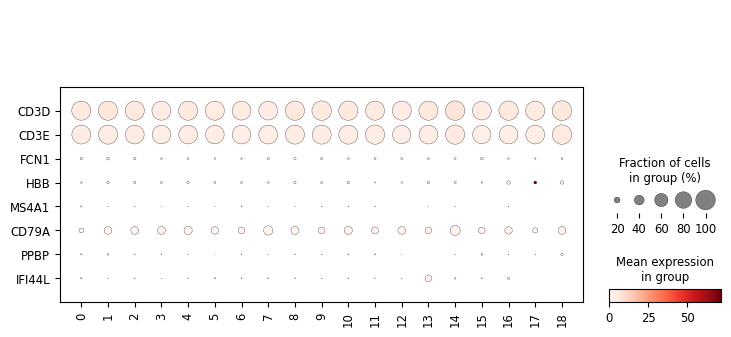

In [161]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

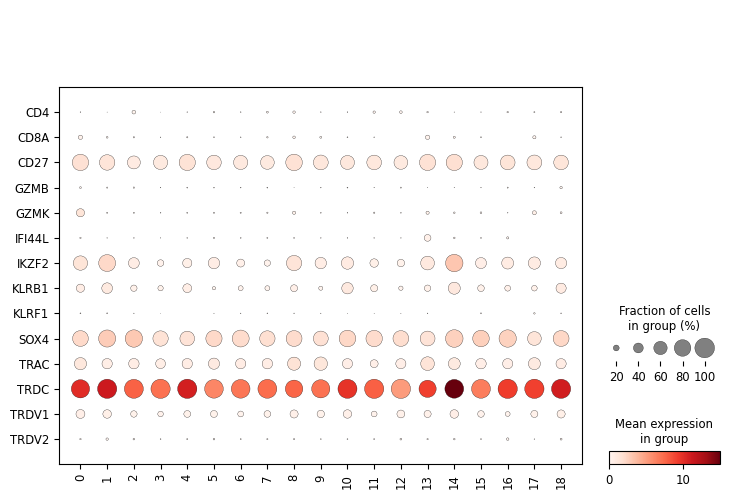

In [162]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [163]:
adata = add_labels(adata, original_df)

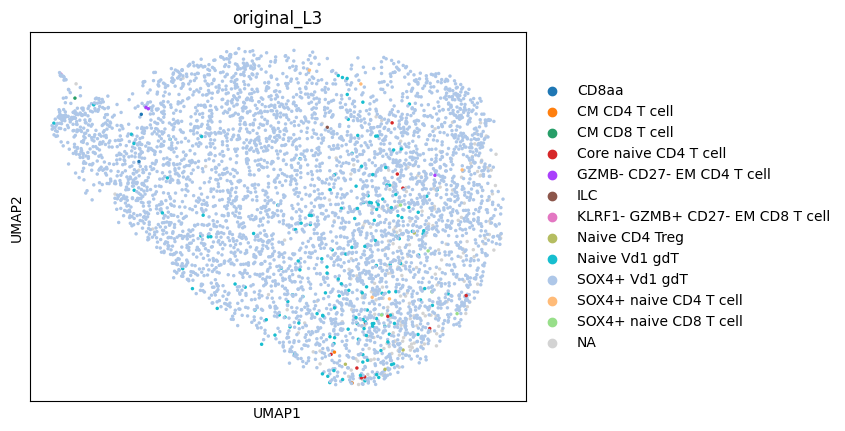

In [164]:
sc.pl.umap(adata, color = 'original_L3')

In [165]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
SOX4+ Vd1 gdT                       4409
NaN                                  229
Naive Vd1 gdT                        154
Core naive CD4 T cell                 11
SOX4+ naive CD4 T cell                 5
SOX4+ naive CD8 T cell                 5
Naive CD4 Treg                         4
GZMB- CD27- EM CD4 T cell              3
CD8aa                                  2
CM CD4 T cell                          2
CM CD8 T cell                          1
ILC                                    1
KLRF1- GZMB+ CD27- EM CD8 T cell       1
Name: count, dtype: int64

In [166]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
SOX4+ Vd1 gdT                       0.913404
NaN                                 0.047441
Naive Vd1 gdT                       0.031904
Core naive CD4 T cell               0.002279
SOX4+ naive CD4 T cell              0.001036
SOX4+ naive CD8 T cell              0.001036
Naive CD4 Treg                      0.000829
GZMB- CD27- EM CD4 T cell           0.000622
CD8aa                               0.000414
CM CD4 T cell                       0.000414
CM CD8 T cell                       0.000207
ILC                                 0.000207
KLRF1- GZMB+ CD27- EM CD8 T cell    0.000207
Name: count, dtype: float64

# Vd2 gdT

## Review GZMB+ Vd2 gdT

In [167]:
cell_type = 'GZMB+ Vd2 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [168]:
type_uuid

'946ade2f-5ae8-463b-aa0a-8ba08ab07d19'

In [169]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 946ade2f-5ae8-463b-aa0a-8ba08ab07d19
Files have been successfully downloaded!


### Clustering

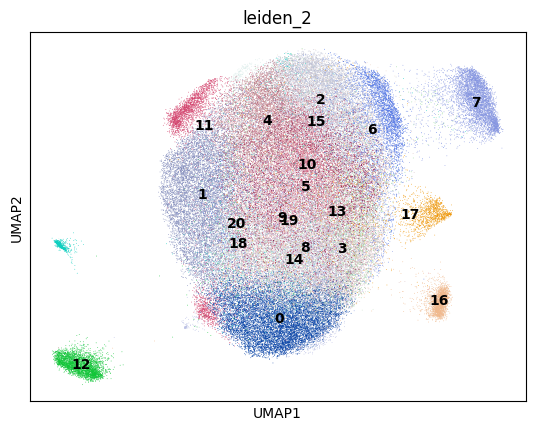

In [170]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

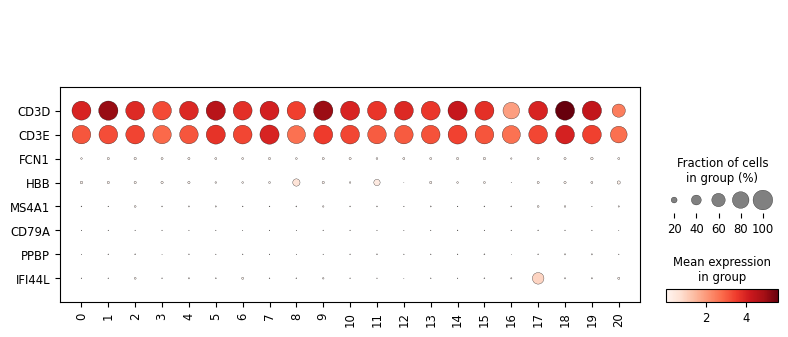

In [171]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

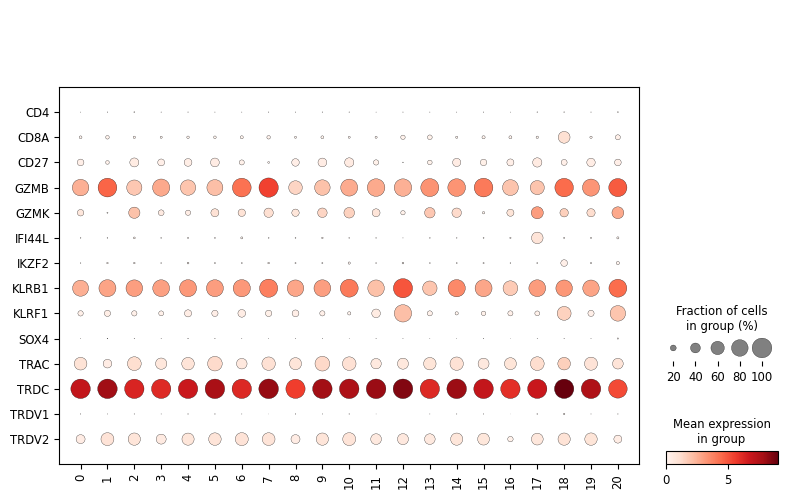

In [172]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [173]:
adata = add_labels(adata, original_df)

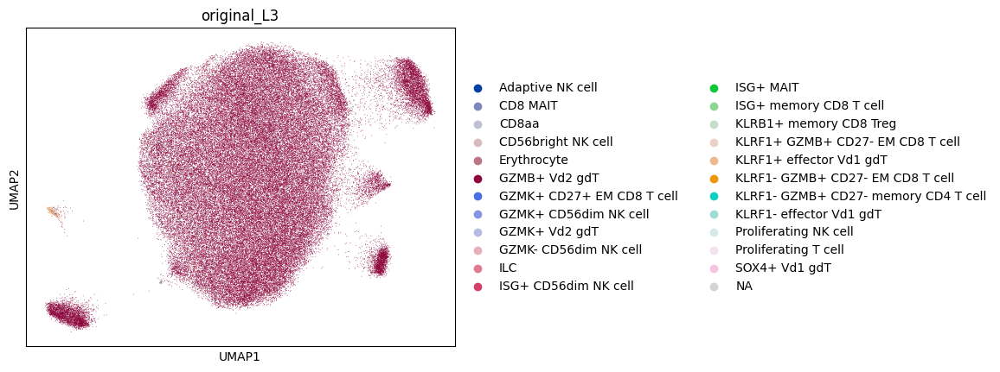

In [174]:
sc.pl.umap(adata, color = 'original_L3')

In [175]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMB+ Vd2 gdT                           88763
GZMK+ Vd2 gdT                            1710
KLRF1+ effector Vd1 gdT                   799
KLRF1- GZMB+ CD27- EM CD8 T cell          511
NaN                                       429
Adaptive NK cell                          415
KLRF1- effector Vd1 gdT                   285
KLRF1+ GZMB+ CD27- EM CD8 T cell          106
GZMK- CD56dim NK cell                      94
KLRF1- GZMB+ CD27- memory CD4 T cell       70
GZMK+ CD56dim NK cell                      44
GZMK+ CD27+ EM CD8 T cell                  16
ISG+ CD56dim NK cell                        9
Proliferating T cell                        8
ISG+ MAIT                                   6
Proliferating NK cell                       5
CD8 MAIT                                    3
ISG+ memory CD8 T cell                      3
CD56bright NK cell                          3
KLRB1+ memory CD8 Treg                      2
Erythrocyte                                 2
CD8aa                 

In [176]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMB+ Vd2 gdT                           0.951515
GZMK+ Vd2 gdT                           0.018331
KLRF1+ effector Vd1 gdT                 0.008565
KLRF1- GZMB+ CD27- EM CD8 T cell        0.005478
NaN                                     0.004599
Adaptive NK cell                        0.004449
KLRF1- effector Vd1 gdT                 0.003055
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.001136
GZMK- CD56dim NK cell                   0.001008
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000750
GZMK+ CD56dim NK cell                   0.000472
GZMK+ CD27+ EM CD8 T cell               0.000172
ISG+ CD56dim NK cell                    0.000096
Proliferating T cell                    0.000086
ISG+ MAIT                               0.000064
Proliferating NK cell                   0.000054
CD8 MAIT                                0.000032
ISG+ memory CD8 T cell                  0.000032
CD56bright NK cell                      0.000032
KLRB1+ memory CD8 Treg                  0.000021
Erythroc

## Review GZMK+ Vd2 gdT

In [177]:
cell_type = 'GZMK+ Vd2 gdT'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [178]:
type_uuid

'391a4087-712a-4c99-bcb2-4d3b98a68184'

In [179]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 391a4087-712a-4c99-bcb2-4d3b98a68184
Files have been successfully downloaded!


### Clustering

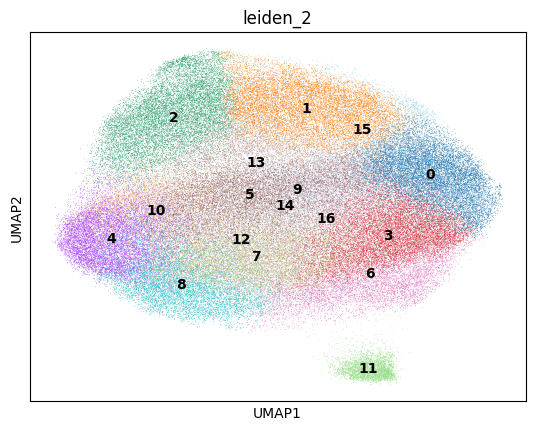

In [180]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

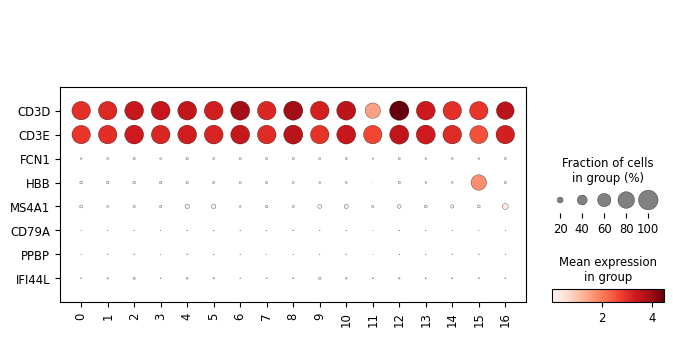

In [181]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

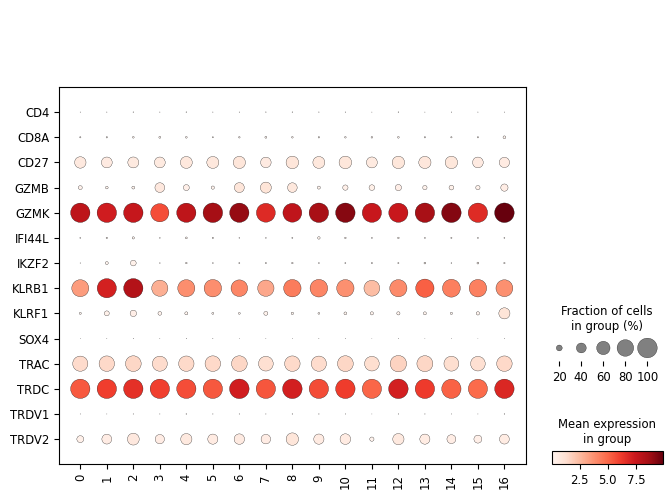

In [182]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [183]:
adata = add_labels(adata, original_df)

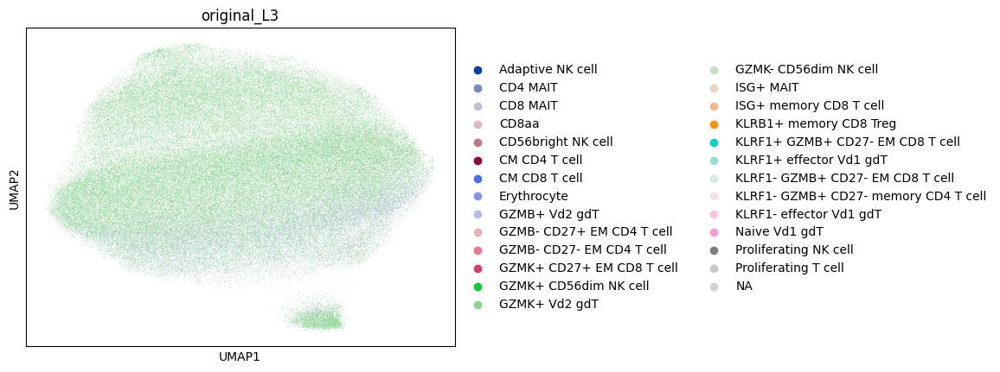

In [184]:
sc.pl.umap(adata, color = 'original_L3')

In [185]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
GZMK+ Vd2 gdT                           103931
GZMB+ Vd2 gdT                            14996
NaN                                       1371
GZMK+ CD27+ EM CD8 T cell                  553
CD8 MAIT                                   522
GZMK+ CD56dim NK cell                       86
CM CD8 T cell                               61
GZMB- CD27+ EM CD4 T cell                   57
KLRF1+ GZMB+ CD27- EM CD8 T cell            43
CD8aa                                       35
KLRF1- GZMB+ CD27- EM CD8 T cell            32
KLRF1+ effector Vd1 gdT                     25
KLRF1- GZMB+ CD27- memory CD4 T cell        22
ISG+ MAIT                                   22
CD4 MAIT                                    17
KLRF1- effector Vd1 gdT                     15
CD56bright NK cell                           8
Adaptive NK cell                             6
GZMK- CD56dim NK cell                        4
Naive Vd1 gdT                                4
Proliferating T cell                         4
I

In [186]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
GZMK+ Vd2 gdT                           0.853145
GZMB+ Vd2 gdT                           0.123099
NaN                                     0.011254
GZMK+ CD27+ EM CD8 T cell               0.004539
CD8 MAIT                                0.004285
GZMK+ CD56dim NK cell                   0.000706
CM CD8 T cell                           0.000501
GZMB- CD27+ EM CD4 T cell               0.000468
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000353
CD8aa                                   0.000287
KLRF1- GZMB+ CD27- EM CD8 T cell        0.000263
KLRF1+ effector Vd1 gdT                 0.000205
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000181
ISG+ MAIT                               0.000181
CD4 MAIT                                0.000140
KLRF1- effector Vd1 gdT                 0.000123
CD56bright NK cell                      0.000066
Adaptive NK cell                        0.000049
GZMK- CD56dim NK cell                   0.000033
Naive Vd1 gdT                           0.000033
Prolifer

# Proliferating T cell

In [187]:
cell_type = 'Proliferating T cell'
type_uuid = search_df['id'].loc[search_df['AIFI_L3'] == cell_type].tolist()[0]

In [188]:
type_uuid

'24217355-6230-4fa7-9954-f8f18c50d752'

In [189]:
adata = read_adata_uuid(type_uuid)

downloading fileID: 24217355-6230-4fa7-9954-f8f18c50d752
Files have been successfully downloaded!


### Clustering

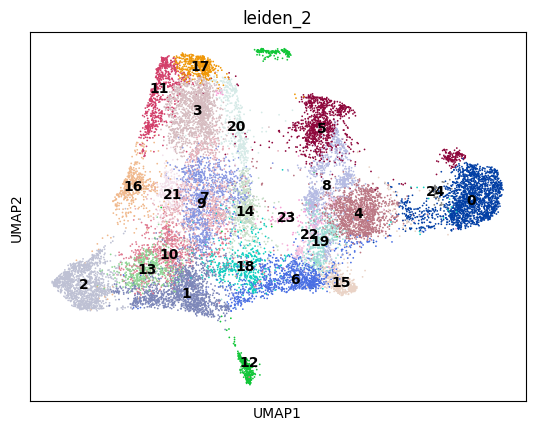

In [190]:
sc.pl.umap(adata, color = 'leiden_2', legend_loc = 'on data')

### Marker expression

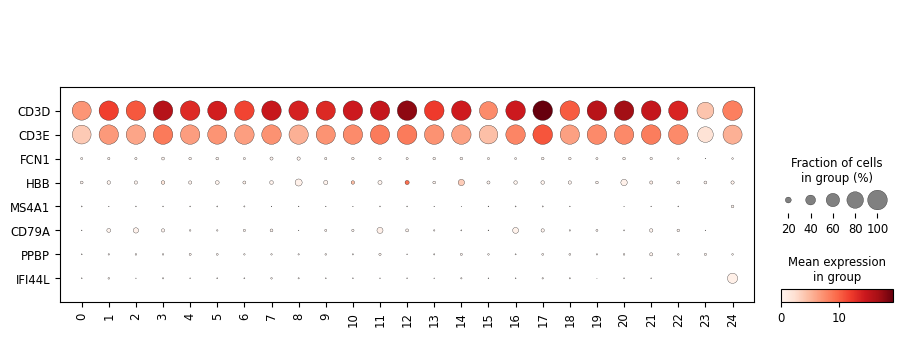

In [191]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = broad_markers, swap_axes = True)

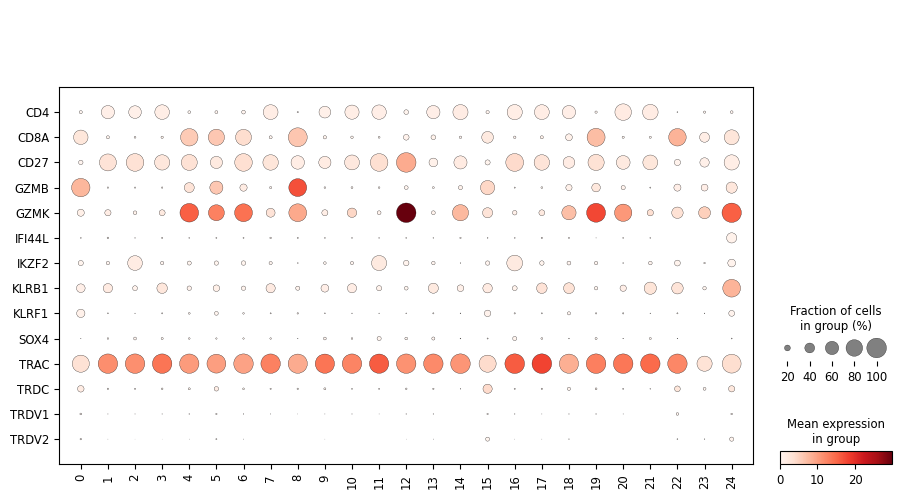

In [192]:
sc.pl.dotplot(adata, groupby = 'leiden_2', var_names = class_markers, swap_axes = True)

### Comparison to original labels

In [193]:
adata = add_labels(adata, original_df)

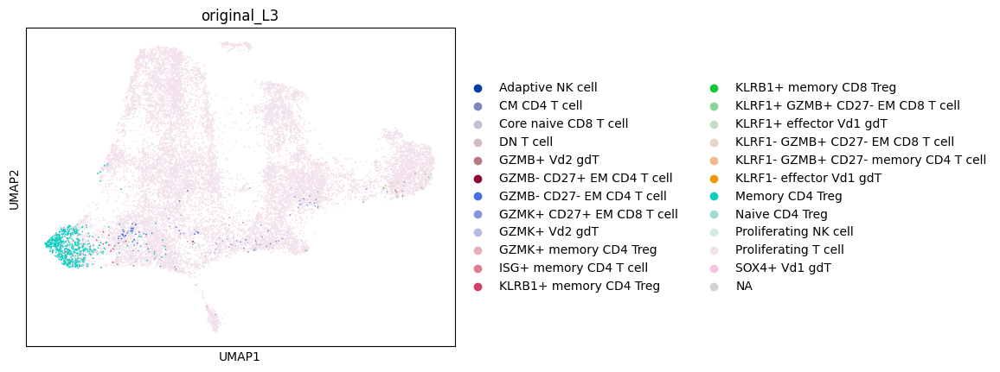

In [194]:
sc.pl.umap(adata, color = 'original_L3')

In [195]:
adata.obs['original_L3'].value_counts(dropna = False)

original_L3
Proliferating T cell                    17874
Memory CD4 Treg                           709
GZMK+ CD27+ EM CD8 T cell                  78
NaN                                        71
GZMB- CD27- EM CD4 T cell                  66
Proliferating NK cell                      49
KLRF1- GZMB+ CD27- EM CD8 T cell           31
CM CD4 T cell                              19
KLRB1+ memory CD4 Treg                     12
DN T cell                                   9
KLRF1+ effector Vd1 gdT                     8
KLRF1+ GZMB+ CD27- EM CD8 T cell            7
GZMB+ Vd2 gdT                               5
KLRF1- GZMB+ CD27- memory CD4 T cell        3
GZMK+ memory CD4 Treg                       3
KLRF1- effector Vd1 gdT                     2
Adaptive NK cell                            2
ISG+ memory CD4 T cell                      2
Core naive CD8 T cell                       2
GZMK+ Vd2 gdT                               1
Naive CD4 Treg                              1
GZMB- CD27+ EM CD4 T c

In [199]:
adata.obs['original_L3'].value_counts(dropna = False) / adata.obs.shape[0]

original_L3
Proliferating T cell                    0.942871
Memory CD4 Treg                         0.037400
GZMK+ CD27+ EM CD8 T cell               0.004115
NaN                                     0.003745
GZMB- CD27- EM CD4 T cell               0.003482
Proliferating NK cell                   0.002585
KLRF1- GZMB+ CD27- EM CD8 T cell        0.001635
CM CD4 T cell                           0.001002
KLRB1+ memory CD4 Treg                  0.000633
DN T cell                               0.000475
KLRF1+ effector Vd1 gdT                 0.000422
KLRF1+ GZMB+ CD27- EM CD8 T cell        0.000369
GZMB+ Vd2 gdT                           0.000264
KLRF1- GZMB+ CD27- memory CD4 T cell    0.000158
GZMK+ memory CD4 Treg                   0.000158
KLRF1- effector Vd1 gdT                 0.000106
Adaptive NK cell                        0.000106
ISG+ memory CD4 T cell                  0.000106
Core naive CD8 T cell                   0.000106
GZMK+ Vd2 gdT                           0.000053
Naive CD

In [202]:
os.system('jupyter nbconvert --to html --template pj 13d-Python_review_filtered_L3_other_t_cell_data.ipynb')

[NbConvertApp] WARNING | Config option `kernel_spec_manager_class` not recognized by `NbConvertApp`.
[NbConvertApp] Converting notebook 13d-Python_review_filtered_L3_other_t_cell_data.ipynb to html
[NbConvertApp] Writing 20351082 bytes to 13d-Python_review_filtered_L3_other_t_cell_data.html


0

In [203]:
import session_info
session_info.show()